# In this scenario, we set up 2 agents: defense Agent at node 3, attack Agent at node 5

# Initialize Global Value

In [13]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from math import tan,acos
import os
  

LoadScalingFactor=2000
GenerationScalingFactor=50
SlackBusVoltage=1.02
power_factor=0.9
IncludeSolar=1

LineNames = ('l_632_633','l_632_645','l_632_671','l_633_634','l_645_646','l_650_632','l_671_680','l_671_684',
             'l_671_692','l_684_611','l_684_652','l_692_675','l_u_650')

AllBusNames = ('sourcebus',
               'load_611','load_634','load_645','load_646','load_652','load_671','load_675','load_692',
               'bus_611','bus_634','bus_645','bus_646','bus_652','bus_671','bus_675','bus_692','bus_632',
               'bus_633','bus_650','bus_680','bus_684')

LoadBusNames = AllBusNames[1:9]
BusNames = AllBusNames[9:22]
IeeeFeeder = 13

LoadList = np.array([6,7,8,13,3,12,11,10])-1
NodeList = np.array([650,632,671,680,633,634,645,646,684,611,692,675,652])
BusesWithControl = NodeList[LoadList]

NumberOfLoads=len(LoadBusNames)
NumberOfNodes=len(BusNames)

FeederMap = np.array(
      [[ 0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-1.,  0.,  1.,  0.,  1.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -1.,  0.,  1.,  0.,  0.,  0.,  0.,  1.,  0.,  1.,  0.,  0.],
       [ 0.,  0., -1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -1.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0., -1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -1.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., -1.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0., -1.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  1.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., -1.,  0.,  0.,  0.,  0.],
       [ 0.,  0., -1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., -1.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., -1.,  0.,  0.,  0.,  0.]])

Z_in_ohm = np.array(
      [[0.00000000e+00+0.00000000e+00j],
       [1.31250000e-01+3.85568182e-01j],
       [1.31250000e-01+3.85568182e-01j],
       [6.56250000e-02+1.92784091e-01j],
       [7.12689394e-02+1.11875000e-01j],
       [1.42537879e-05+2.23750000e-05j],
       [1.25890152e-01+1.27566288e-01j],
       [7.55340909e-02+7.65397727e-02j],
       [7.52159091e-02+7.70965909e-02j],
       [7.55227273e-02+7.65625000e-02j],
       [1.42537879e-05+2.23750000e-05j],
       [7.55871212e-02+4.22632576e-02j],
       [2.03409091e-01+7.76363636e-02j]])

Paths = np.array(
      [[ 1.,  2.,  3.,  4.,  0.],
       [ 1.,  2.,  5.,  6.,  0.],
       [ 1.,  2.,  7.,  8.,  0.],
       [ 1.,  2.,  3.,  9., 10.],
       [ 1.,  2.,  3., 11., 12.],
       [ 1.,  2.,  3.,  9., 13.]])

#Base value calculation
Vbase = 4.16e3 
Sbase = 1.0 
Zbase = Vbase**2/Sbase
Ibase = Sbase/Vbase
Z = Z_in_ohm/Zbase

#Load Data Pertaining to Loads to create a profile
PV_Feeder_model = 10
FileDirectoryBase = 'C:\\Users\\Sy-Toan\\ceds-cigar\\LBNL_Simulations\\testpvnum10\\'

Time = list(range(1441))
TotalTimeSteps = len(Time)

#preparing QSTS_Data
QSTS_Data = np.zeros((TotalTimeSteps,4,IeeeFeeder))
for node in range(NumberOfLoads):
    FileDirectoryExtenstion = 'node_' + str(node+1) + '_pv_' + str(PV_Feeder_model) + '_minute.csv'
    FileName = FileDirectoryBase + FileDirectoryExtenstion
    MatFile = np.genfromtxt(FileName, delimiter=',')
    QSTS_Data[:,:,int(LoadList[node])] = MatFile

#Seperate PV Generation Data
Generation = QSTS_Data[:,1,:]*GenerationScalingFactor
Load = QSTS_Data[:,3,:]*LoadScalingFactor
Generation = np.squeeze(Generation)/Sbase
Load = np.squeeze(Load)/Sbase
MaxGenerationPossible = np.max(Generation, axis=0)

#Voltage Observer Parameters and related variable initialization
LowPassFilterFrequency = 0.1
HighPassFilterFrequency = 1.0
Gain_Energy = 1e5
TimeStep = 1

#ZIP load modeling
ConstantImpedanceFraction = 0.2
ConstantCurrentFraction = 0.05
ConstantPowerFraction = 0.75
ZIP_demand = np.zeros((TotalTimeSteps,IeeeFeeder,3), dtype=np.complex)

for node in range(1,IeeeFeeder):
    ZIP_demand[:,node,:] = np.array([ConstantPowerFraction*Load[:,node].astype(complex), 
                            ConstantCurrentFraction*Load[:,node].astype(complex), 
                            ConstantImpedanceFraction*Load[:,node].astype(complex)]).T*(1 + 1j*tan(acos(power_factor)))
    
#Power Flow with QVQP Control Case
Sbar =  MaxGenerationPossible * GenerationScalingFactor

PowerEachTimeStep_vqvp = np.zeros((IeeeFeeder,3), dtype=np.complex)
SolarGeneration_vqvp = Generation * GenerationScalingFactor
InverterRateOfChangeLimit = 100 
InverterRateOfChangeActivate = 0

#Drop Control Parameters
VQ_start = 1.01
VQ_end = 1.015
VP_start = 1.015
VP_end = 1.02

VBP = np.full([IeeeFeeder, 4, TotalTimeSteps], np.nan)
VBP[:,0,0] = VQ_start
VBP[:,1,0] = VQ_end
VBP[:,2,0] = VP_start
VBP[:,3,0] = VP_end

InverterLPF = 1
ThreshHold_vqvp = 0.25
V0 = np.full((TotalTimeSteps, 1), SlackBusVoltage)
#Adaptive controller parameters

#Delays                 [  1   2   3*  4   5   6*  7*  8*  9* 10* 11* 12* 13*
Delay_VoltageSampling = [ 0,   0,  1,  0,  0,  1,  1,  1,  1,  1,  1,  1,  1]

# Useful Functions

In [14]:
def FBSfun(V0,loads,Z,B):
    n=len(Z)
    V=np.zeros(shape=(n,1),dtype=complex)
    s=np.copy(V)
    V[0,0]=V0
    I = np.zeros(shape=(n, 1),dtype=complex)
    I[0,0] = 0

    T=[]
    J=[1]

    for k in range(2,n+1):
        t=np.sum(B[k-1,:])
        if (t==-1):
            T.append(k)
        elif (t>=1):
            J.append(k)
    tol = 0.0001
    itera = 0
    Vtest = 0

    T=np.array(T)-1
    J=np.array(J)-1
    
    while(abs(Vtest-V0) >=tol):
        V[0,0]=V0
        for k in range(0, n - 1):
            idx = np.where(B[k, :] > 0)
            V[idx,0]=V[k,0]-np.multiply(Z[idx,0],I[idx,0])

        for i in range(len(T)-1,-1,-1):
            t=T[i]
            v=np.array([1, abs(V[t,0]), abs(V[t,0])**2])
            s[t,0]=np.dot(loads[t,:],np.transpose(v))
            I[t,0]=np.conj(s[t,0]/V[t,0])
            flag=True
            idx= np.where(B[t,:] == -1)[0]
            while(flag):
                V[idx,0] = V[t,0] + Z[t,0]*I[t,0]
                v=np.array([1, abs(V[idx,0]),abs(V[idx,0])**2])
                s[idx,0]=np.dot(loads[idx,:],np.transpose(v))
                I[idx,0]=np.conj(s[idx,0]/V[idx,0])+I[t,0]
                if (len(np.where(J==idx)[0])==0):
                    t=idx
                    idx=np.where(B[idx,:][0]==-1)[0]
                else:
                    flag=False
        
        for k in range(len(J)-1,0,-1):
            t=J[k]
            v = np.array([1, abs(V[t, 0]), abs(V[t, 0]) ** 2])
            s[t, 0] = np.dot(loads[t, :], np.transpose(v))
            load_current=np.conj(s[t, 0] / V[t, 0])
            idx=np.where(B[t,:] > 0)[0]
            Itot = load_current
            for y in range(0,len(idx)):
                Itot=Itot+I[idx[y],0]
                
            I[t,0]= Itot
            flag= True
            idx = np.where(B[t, :] == -1)[0][0]
            while flag:
                V[idx, 0] = V[t, 0] + Z[t, 0] * I[t, 0]
                v = np.array([1, abs(V[idx, 0]), abs(V[idx, 0]) ** 2])
                s[idx, 0] = np.dot(loads[idx, :], np.transpose(v))
                I[idx, 0] = np.conj(s[idx, 0] / V[idx, 0]) + I[t, 0]
                if (len(np.where(J==idx)[0])==0):
                    t=idx
                    idx=np.where(B[idx,:][0]==-1)[0]
                else:
                    flag=False

        Vtest=V[0,0]
        itera +=1

    V[0,0] = V0
    S=np.multiply(V,np.conj(I))
    
    return np.array(V, dtype=np.complex).squeeze(),np.array(S, dtype=np.complex).squeeze()

def voltage_observer(vk, vkm1, psikm1, epsilonkm1, ykm1, f_hp, f_lp, gain, T):
    Vmagk = abs(vk)
    Vmagkm1 = abs(vkm1)
    psik = (Vmagk - Vmagkm1 - (f_hp*T/2-1)*psikm1)/(1+f_hp*T/2)
    epsilonk = gain*(psik**2)
    yk = (T*f_lp*(epsilonk + epsilonkm1) - (T*f_lp - 2)*ykm1)/(2 + T*f_lp)
    return yk, psik, epsilonk

def inverter_VoltVarVoltWatt_model(gammakm1,solar_irr,Vk,Vkm1,VBP,T,lpf,Sbar,pkm1,qkm1,ROC_lim,InverterRateOfChangeActivate,ksim,Delay_VoltageSampling):
    Vmagk = abs(Vk)
    Vmagkm1 = abs(Vkm1) 
    gammakcalc = (T*lpf*(Vmagk + Vmagkm1) - (T*lpf - 2)*gammakm1)/(2 + T*lpf)
    if ksim % Delay_VoltageSampling == 0:
        gammakused = gammakcalc
    else: 
        gammakused = gammakm1
    
    pk = 0
    qk = 0
    c = 0
    q_avail = 0

    if solar_irr < 2500:
        pk = 0
        qk = 0
    elif solar_irr >= 2500:
        if gammakused <= VBP[2]:
            pk = -solar_irr
            q_avail = (Sbar**2 - pk**2)**(1/2)
            if gammakused <= VBP[0]:
                qk = 0
            elif gammakused > VBP[0] and gammakused <= VBP[0]:
                c = q_avail/(VBP[1] - VBP[0])
                qk = c*(gammakused - VBP[0])
            else:
                qk = q_avail       
        elif gammakused > VBP[2] and gammakused < VBP[3]:
            d = -solar_irr/(VBP[3] - VBP[2])
            pk = -(d*(gammakused - VBP[2]) + solar_irr);
            qk = (Sbar**2 - pk**2)**(1/2);      
        elif gammakused >= VBP[3]:
            qk = Sbar
            pk = 0
    return qk,pk,gammakused, gammakcalc, c, q_avail

# Define state, environment, agent, buffer

In [15]:
#state of the entire environment at 1 timestep
class _state(object):
    def __init__(self, PET, V, S, InvReal, InvReact, FV, FVC, Fo, Io, Ep):
        self.PET = PET
        self.V = V
        self.S = S
        self.InvReal = InvReal
        self.InvReact = InvReact
        self.FV = FV
        self.FVC = FVC
        self.Fo = Fo
        self.Io = Io
        self.Ep = Ep
    
    def get_state_agent(self, agent):
        arg = (self.PET[agent], np.array([self.V[agent]]), np.array([self.S[agent]]), np.array([self.InvReal[agent]]), np.array([self.InvReact[agent]]),np.array([self.FV[agent]]),np.array([self.FVC[agent]]))
        return abs(np.concatenate(arg, axis = 0))

In [16]:
#create a buffer for training data

from collections import deque
import random
import numpy as np

class ReplayBuffer(object):

    def __init__(self, buffer_size, random_seed=123):
        """
        The right side of the deque contains the most recent experiences 
        """
        self.buffer_size = buffer_size
        self.count = 0
        self.buffer = deque()
        random.seed(random_seed)

    def add(self, s, a, r, t, s2):
        experience = (s, a, r, t, s2)
        if self.count < self.buffer_size: 
            self.buffer.append(experience)
            self.count += 1
        else:
            self.buffer.popleft()
            self.buffer.append(experience)

    def size(self):
        return self.count

    def sample_batch(self, batch_size):
        batch = []

        if self.count < batch_size:
            batch = random.sample(self.buffer, self.count)
        else:
            batch = random.sample(self.buffer, batch_size)

        s_batch = np.array([_[0] for _ in batch])
        a_batch = np.array([_[1] for _ in batch])
        r_batch = np.array([_[2] for _ in batch])
        t_batch = np.array([_[3] for _ in batch])
        s2_batch = np.array([_[4] for _ in batch])

        return s_batch, a_batch, r_batch, t_batch, s2_batch

    def clear(self):
        self.buffer.clear()
        self.count = 0

In [17]:
class OrnsteinUhlenbeckActionNoise:
    def __init__(self, mu, sigma=0.005, theta=.1, dt=1e-2, x0=None):
        self.theta = theta
        self.mu = mu
        self.sigma = sigma
        self.dt = dt
        self.x0 = x0
        self.reset()

    def __call__(self):
        x = self.x_prev + self.theta * (self.mu - self.x_prev) * self.dt + \
                self.sigma * np.sqrt(self.dt) * np.random.normal(size=self.mu.shape)
        self.x_prev = x
        return x

    def reset(self):
        self.x_prev = self.x0 if self.x0 is not None else np.zeros_like(self.mu)

    def __repr__(self):
        return 'OrnsteinUhlenbeckActionNoise(mu={}, sigma={})'.format(self.mu, self.sigma)

In [18]:
class env(object):
    
    ######### reset the env ####################
    def __init__(self):
        self.reset()
    
    def reset(self):

        self.stage = 0
        PET, V, S = self._init_PET_VS()
        InvReal = np.zeros(NumberOfNodes)
        InvReact = np.zeros(NumberOfNodes)
        FV = np.zeros(NumberOfNodes)
        FVC = np.zeros(NumberOfNodes)
        Fo = np.zeros(NumberOfNodes)
        Io = np.zeros(NumberOfNodes)
        Ep = np.zeros(NumberOfNodes)
        self.state = _state(PET, V, S, InvReal, InvReact, FV, FVC, Fo, Io, Ep)
        self.terminal = False
        
            
        return self.state
    
    def step(self, action):
        #return next state, reward, terminal or not, precise info
        nextPET = self._cal_next_PET()
        nextV, nextS = self._cal_next_VS(nextPET)
        nextInvReal, nextInvReact, nextFV, nextFVC = self._cal_next_Inv(nextV, action)
        nextFo, nextIo, nextEp = self._cal_next_FIE(nextV)
        nextState = _state(nextPET, nextV, nextS, nextInvReal, nextInvReact, nextFV, nextFVC, nextFo, nextIo, nextEp) 
        
        #update new state, reward and stage
        self.state = nextState
        self.stage += 1
        #check if terminal
        if (self.stage == TotalTimeSteps-1):
            self.terminal = True
            
        return self.state, self.terminal, nextFo, abs(nextV)
   ################################################     
    def _init_PET_VS(self):
        for knode in LoadList:
            PowerEachTimeStep_vqvp[knode,:] = np.array([ZIP_demand[0,knode,0] - SolarGeneration_vqvp[0,knode],
                                                        ZIP_demand[0,knode,1],
                                                        ZIP_demand[0,knode,2]])
            
        V, S = FBSfun(V0[0,0], PowerEachTimeStep_vqvp, Z, FeederMap)
        return PowerEachTimeStep_vqvp, V, S       
    
    def _cal_next_PET(self):
        ksim = self.stage
        currentState = self.state
        for knode in LoadList:
            PowerEachTimeStep_vqvp[knode,:] = np.array([ZIP_demand[ksim+1,knode,0] + currentState.InvReal[knode]
                                                         + 1j*currentState.InvReact[knode], 
                                                        ZIP_demand[ksim+1,knode,1], 
                                                        ZIP_demand[ksim+1,knode,2]])
        return PowerEachTimeStep_vqvp
    
    def _cal_next_VS(self, nextPET):
        ksim = self.stage
        V, S = FBSfun(V0[ksim+1,0], nextPET, Z,FeederMap)
        return V, S  
    
    def _cal_next_Inv(self, nextV, action):
        ksim = self.stage
        currentState = self.state
        
        InvReal = np.zeros(NumberOfNodes)
        InvReact = np.zeros(NumberOfNodes)
        FV = np.zeros(NumberOfNodes)
        FVC = np.zeros(NumberOfNodes)
        
        for knode in LoadList:
            InvReact[knode], InvReal[knode], FV[knode], FVC[knode], _, _ = inverter_VoltVarVoltWatt_model(
                     currentState.FV[knode], SolarGeneration_vqvp[ksim+1,knode], 
                     abs(nextV[knode]), abs(currentState.V[knode]), 
                     action[knode], TimeStep, InverterLPF, 
                     Sbar[knode], currentState.InvReal[knode], 
                     currentState.InvReact[knode], InverterRateOfChangeLimit, 
                     InverterRateOfChangeActivate, ksim+1, Delay_VoltageSampling[knode])
        return InvReal, InvReact, FV, FVC
    
    # ok
    def _cal_next_FIE(self, nextV):
        currentState = self.state
        Fo = np.zeros(NumberOfNodes)
        Io = np.zeros(NumberOfNodes)
        Ep = np.zeros(NumberOfNodes)
        for knode in LoadList:
            Fo[knode], Io[knode], Ep[knode] = voltage_observer(nextV[knode], currentState.V[knode], 
                                                              currentState.Io[knode], currentState.Ep[knode],
                                                              currentState.Fo[knode], HighPassFilterFrequency,
                                                              LowPassFilterFrequency, Gain_Energy, TimeStep) 
        return Fo, Io, Ep


In [19]:
class ActorNetwork(object):
    """
    Input to the network is the state, output is the action
    under a deterministic policy.

    The output layer activation is a tanh to keep the action
    between -action_bound and action_bound
    """

    def __init__(self, sess, state_dim, action_dim, action_bound, learning_rate, tau, batch_size):
        self.sess = sess
        self.s_dim = state_dim
        self.a_dim = action_dim
        self.action_bound = action_bound
        self.learning_rate = learning_rate
        self.tau = tau
        self.batch_size = batch_size


        # Actor Network
        self.inputs, self.out, self.scaled_out = self.create_actor_network()

        self.network_params = tf.trainable_variables()

        # Target Network
        self.target_inputs, self.target_out, self.target_scaled_out = self.create_actor_network()

        self.target_network_params = tf.trainable_variables()[len(self.network_params):]

        # Op for periodically updating target network with online network
        # weights
        self.update_target_network_params = \
            [self.target_network_params[i].assign(tf.multiply(self.network_params[i], self.tau) +
                                                  tf.multiply(self.target_network_params[i], 1. - self.tau))
                for i in range(len(self.target_network_params))]

        # This gradient will be provided by the critic network
        self.action_gradient = tf.placeholder(tf.float32, [None, self.a_dim])

        # Combine the gradients here
        self.unnormalized_actor_gradients = tf.gradients(self.scaled_out, self.network_params, -self.action_gradient)
        self.actor_gradients = list(map(lambda x: x if x is None else tf.div(x, self.batch_size), self.unnormalized_actor_gradients))

        # Optimization Op
        self.optimize = tf.train.AdamOptimizer(self.learning_rate).\
            apply_gradients(zip(self.actor_gradients, self.network_params))

        self.num_trainable_vars = len(
            self.network_params) + len(self.target_network_params)

    def create_actor_network(self):
        inputs = tflearn.input_data(shape=[None, self.s_dim])
        net = tflearn.fully_connected(inputs, 700)
        net = tflearn.layers.normalization.batch_normalization(net)
        net = tflearn.activations.relu(net)
        
        net = tflearn.fully_connected(net, 400)
        net = tflearn.layers.normalization.batch_normalization(net)
        net = tflearn.activations.relu(net)
        
        net = tflearn.fully_connected(net, 200)
        net = tflearn.layers.normalization.batch_normalization(net)
        net = tflearn.activations.relu(net)
        # Final layer weights are init to Uniform[-3e-3, 3e-3]
        w_init = tflearn.initializations.uniform(minval=-0.003, maxval=0.003)
        out = tflearn.fully_connected(
            net, self.a_dim, activation='sigmoid', weights_init=w_init)
        # Scale output to -action_bound to action_bound
        scaled_out = tf.multiply(out, self.action_bound)
        #scaled_out = out
        return inputs, out, scaled_out

    def train(self, inputs, a_gradient):
        self.sess.run(self.optimize, feed_dict={
            self.inputs: inputs,
            self.action_gradient: a_gradient
        })

    def predict(self, inputs):
        return self.sess.run(self.scaled_out, feed_dict={
            self.inputs: inputs
        })

    def predict_target(self, inputs):
        return self.sess.run(self.target_scaled_out, feed_dict={
            self.target_inputs: inputs
        })

    def update_target_network(self):
        self.sess.run(self.update_target_network_params)

    def get_num_trainable_vars(self):
        return self.num_trainable_vars

In [20]:
class CriticNetwork(object):
    """
    Input to the network is the state and action, output is Q(s,a).
    The action must be obtained from the output of the Actor network.

    """

    def __init__(self, sess, state_dim, action_dim, learning_rate, tau, gamma, num_actor_vars):
        self.sess = sess
        self.s_dim = state_dim
        self.a_dim = action_dim
        self.learning_rate = learning_rate
        self.tau = tau
        self.gamma = gamma

        # Create the critic network
        self.inputs, self.action, self.out = self.create_critic_network()

        self.network_params = tf.trainable_variables()[num_actor_vars:]

        # Target Network
        self.target_inputs, self.target_action, self.target_out = self.create_critic_network()

        self.target_network_params = tf.trainable_variables()[(len(self.network_params) + num_actor_vars):]

        # Op for periodically updating target network with online network
        # weights with regularization
        self.update_target_network_params = \
            [self.target_network_params[i].assign(tf.multiply(self.network_params[i], self.tau) \
            + tf.multiply(self.target_network_params[i], 1. - self.tau))
                for i in range(len(self.target_network_params))]

        # Network target (y_i)
        self.predicted_q_value = tf.placeholder(tf.float32, [None,])
        # Define loss and optimization Op
        self.loss = tflearn.mean_square(self.predicted_q_value, self.out)
        self.optimize = tf.train.AdamOptimizer(self.learning_rate).minimize(self.loss)

        # Get the gradient of the net w.r.t. the action.
        # For each action in the minibatch (i.e., for each x in xs),
        # this will sum up the gradients of each critic output in the minibatch
        # w.r.t. that action. Each output is independent of all
        # actions except for one.
        self.action_grads = tf.gradients(self.out, self.action)

    def create_critic_network(self):
        inputs = tflearn.input_data(shape=[None, self.s_dim])
        action = tflearn.input_data(shape=[None, self.a_dim])
        net = tflearn.fully_connected(inputs, 700)
        net = tflearn.layers.normalization.batch_normalization(net)
        net = tflearn.activations.relu(net)
        
        net = tflearn.fully_connected(net, 400)
        net = tflearn.layers.normalization.batch_normalization(net)
        net = tflearn.activations.relu(net)
        
        # Add the action tensor in the 2nd hidden layer
        # Use two temp layers to get the corresponding weights and biases
        t1 = tflearn.fully_connected(net, 200)
        t2 = tflearn.fully_connected(action, 200)

        net = tflearn.activation(
            tf.matmul(net, t1.W) + tf.matmul(action, t2.W) + t2.b, activation='relu')

        # linear layer connected to 1 output representing Q(s,a)
        # Weights are init to Uniform[-3e-3, 3e-3]
        w_init = tflearn.initializations.uniform(minval=-0.003, maxval=0.003)
        out = tflearn.fully_connected(net, 1, weights_init=w_init)
        return inputs, action, out

    def train(self, inputs, action, predicted_q_value):
        return self.sess.run([self.out, self.optimize], feed_dict={
            self.inputs: inputs,
            self.action: action,
            self.predicted_q_value: predicted_q_value
        })

    def predict(self, inputs, action):
        return self.sess.run(self.out, feed_dict={
            self.inputs: inputs,
            self.action: action
        })

    def predict_target(self, inputs, action):
        return self.sess.run(self.target_out, feed_dict={
            self.target_inputs: inputs,
            self.target_action: action
        })

    def action_gradients(self, inputs, actions):
        return self.sess.run(self.action_grads, feed_dict={
            self.inputs: inputs,
            self.action: actions
        })

    def update_target_network(self):
        self.sess.run(self.update_target_network_params)


In [21]:
def plotting(volDef, acDef, reDef, volAtt, acAtt, reAtt):
    f = plt.figure()
    f.set_figheight(2)
    f.set_figwidth(20)
    f.add_subplot(1,6,1)
    plt.plot(volDef)
    f.add_subplot(1,6,2)
    plt.plot(acDef)
    f.add_subplot(1,6,3)
    plt.plot(reDef)
    f.add_subplot(1,6,4)
    plt.plot(volAtt)
    f.add_subplot(1,6,5)
    plt.plot(acAtt)
    f.add_subplot(1,6,6)
    plt.plot(reAtt)
    plt.show(block=True)

In [22]:
class Agent(object):
    
    def __init__(self, sess, agent_code, attack=False, state_dim=9, action_dim=4, action_bound=0.15,
                 actor_lr=0.0001, critic_lr=0.001, tau=0.001, gamma=0.99, batch_size=50, buffer_size=5000, random_seed=1234):
        self.agent = agent_code
        self.sess = sess
        self.attack = attack
        self.s_dim = state_dim
        self.a_dim = action_dim
        self.action_bound = action_bound
        self.actor_lr = actor_lr
        self.critic_lr = critic_lr
        self.tau = tau
        self.batch_size = batch_size
        self.gamma = gamma
        self.buffer_size = buffer_size
        self.random_seed = random_seed
        self.EXPLORE = 144100
        self.epsilon = 1
        self.ep_reward = 0
        self.actions =[]
        self.voltage= []
        self.allReward=[]
        self.reward = 0
        #create actor

        self.actor = ActorNetwork(self.sess, self.s_dim, self.a_dim, self.action_bound,
                                  self.actor_lr, self.tau, self.batch_size)
        
        #create critic
        self.critic = CriticNetwork(self.sess, self.s_dim, self.a_dim,
                               self.critic_lr, self.tau,
                               self.gamma,
                               self.actor.get_num_trainable_vars())
        
        self.sess.run(tf.global_variables_initializer())
        self.actor.update_target_network()
        self.critic.update_target_network()
        
        #create actor noise
        self.actor_noise = OrnsteinUhlenbeckActionNoise(mu=np.zeros(self.a_dim), sigma=0.02, theta=.1, dt=1e-2)
        
        #create buffer
        self.replay_buffer = ReplayBuffer(self.buffer_size, self.random_seed)
        
        
    def observe_reward(self, yk):
        if self.attack:
            self.reward = yk[self.agent]
        else:
            if yk[self.agent] >0.25:
                self.reward = -yk[self.agent]
            else:
                self.reward = 0
        return self.reward
    
    def get_action(self, state):
        #decay exploration
        s = state.get_state_agent(self.agent)
        self.epsilon -= 1/self.EXPLORE
        self.a = self.actor.predict(np.reshape(s, (1, self.actor.s_dim))) + self.actor_noise() * max(self.epsilon, 0)
        return self.a[0]
    
    def add_experience_to_buffer(self, s, a, r, t, s2):
        self.replay_buffer.add(np.reshape(s.get_state_agent(self.agent), (self.actor.s_dim,)), np.reshape(a, (self.actor.a_dim,)), self.observe_reward(r),
                              t, np.reshape(s2.get_state_agent(self.agent), (self.actor.s_dim,)))
        
    def train(self):
        if self.replay_buffer.size() > self.batch_size:
            s_batch, a_batch, r_batch, t_batch, s2_batch = self.replay_buffer.sample_batch(self.batch_size)
            target_q = self.critic.predict_target(s2_batch, self.actor.predict_target(s2_batch))
        
            y_i = []
            for k in range(self.batch_size):
                if t_batch[k]:
                    y_i.append(r_batch[k])
                else:
                    y_i.append(r_batch[k] + self.critic.gamma * target_q[k])
            
            predicted_q_value, _ = self.critic.train(s_batch, a_batch, np.reshape(y_i, self.batch_size, 1))

            #self.ep_ave_max_q += np.amax(predicted_q_value)
        
            a_outs = self.actor.predict(s_batch)
            grads = self.critic.action_gradients(s_batch, a_outs)
            self.actor.train(s_batch, grads[0])

            # Update target networks
            self.actor.update_target_network()
            self.critic.update_target_network()
    
    def summaries(self, terminal, voltage, action):
        if terminal == False:
            self.ep_reward += self.reward
            self.actions.append(copy.deepcopy(action))
            self.voltage.append(voltage[self.agent])
        else:
            self.ep_reward += self.reward
            self.allReward.append(self.ep_reward)
            self.actions.append(action)
            self.voltage.append(voltage[self.agent])
            
            #get the value
            allR = copy.deepcopy(self.allReward)
            allA = copy.deepcopy(self.actions)
            allV = copy.deepcopy(self.voltage)
            #reset for new episode
            self.actions = []
            self.ep_reward = 0
            self.voltage = []
            return allV, allA, allR
        

In [23]:
def train(sess, env, args, allAction, defAgent, attAgent):
    
    defenseAgent = Agent(sess, agent_code=defAgent, attack=False)
    attackAgent = Agent(sess, agent_code=attAgent, attack=True)
    
    for i in range(int(args['max_episodes'])):
        s = env.reset()
        
        translate = np.array([0.9, 0.9, 0.9, 0.9])
        for j in range(int(args['max_episode_len'])):
            if j == 0:
                allAction[defAgent] = np.array([1.01,1.015,1.015,1.02])
                allAction[attAgent] = np.array([1.01,1.015,1.015,1.02])
                aDef = np.array([1.01,1.015,1.015,1.02])-translate
                aAtt = np.array([1.01,1.015,1.015,1.02])-translate
            else:
                aDef = defenseAgent.get_action(s)
                aAtt = attackAgent.get_action(s)
                allAction[defAgent] = copy.deepcopy(aDef + translate)
                allAction[attAgent] = copy.deepcopy(aAtt + translate)
            
            #call the simulation
            s2, terminal, y_k, voltage = env.step(allAction)
            
            defenseAgent.add_experience_to_buffer(s, aDef, y_k, terminal, s2)
            attackAgent.add_experience_to_buffer(s, aAtt, y_k, terminal, s2)
            
            defenseAgent.train()
            attackAgent.train()
            
            s = s2
            if not terminal:
                defenseAgent.summaries(terminal, voltage, allAction[defAgent])
                attackAgent.summaries(terminal, voltage, allAction[attAgent])
            else:
                sumVoltageDef, sumActionDef, sumRewardDef = defenseAgent.summaries(terminal, voltage, allAction[defAgent])
                sumVoltageAtt, sumActionAtt, sumRewardAtt = attackAgent.summaries(terminal, voltage, allAction[attAgent])
                print('Agent: {:d} | Defense | Reward: {:f} | Episode: {:d} '.format(defAgent, sumRewardDef[-1:][0],i))
                print('Agent: {:d} | Attack  | Reward: {:f} | Episode: {:d} '.format(attAgent, sumRewardAtt[-1:][0],i), end="")
                plotting(sumVoltageDef, sumActionDef, sumRewardDef, sumVoltageAtt, sumActionAtt, sumRewardAtt)
                break
    return defenseAgent, attackAgent

#main body

def main():
    with tf.Session() as sess:
        simulation = env()        
        args={}
        args['state_dim'] = 9
        args['action_dim'] = 4
        args['action_bound'] = 0.15
        args['actor_lr'] = 0.0001
        args['critic_lr'] = 0.001
        args['gamma'] = 0.99
        args['tau'] = 0.001
        args['buffer_size'] = 5000
        args['minibatch_size'] = 50
        args['random_seed'] = 1234
        args['max_episodes'] = 150
        args['max_episode_len'] = TotalTimeSteps
        args['summary_dir'] = os.getcwd()
        
        #init 
        tf.set_random_seed(args['random_seed'])
        VBP = np.full([IeeeFeeder, 4, TotalTimeSteps], np.nan)
        for i in range(1441):
            VBP[:,0,i] = VQ_start
            VBP[:,1,i] = VQ_end
            VBP[:,2,i] = VP_start
            VBP[:,3,i] = VP_end
        allAction = copy.deepcopy(VBP[:,:,0])
        
        defenseAgent = 2
        attackAgent = 5
        defAgent, attAgent = train(sess, simulation, args, allAction, defenseAgent, attackAgent)
        #test(sess, simulation, args, actor)
        return defAgent, attAgent

Agent: 2 | Defense | Reward: -354.039849 | Episode: 0 
Agent: 5 | Attack  | Reward: 155.365896 | Episode: 0 

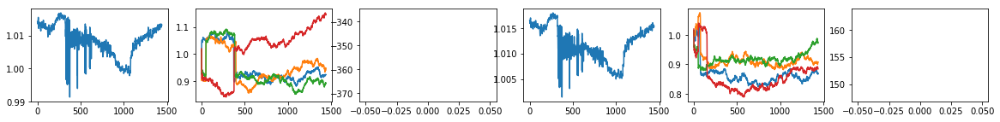

Agent: 2 | Defense | Reward: -176.398978 | Episode: 1 
Agent: 5 | Attack  | Reward: 98.585123 | Episode: 1 

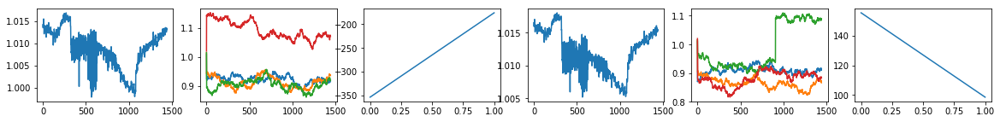

Agent: 2 | Defense | Reward: -371.613694 | Episode: 2 
Agent: 5 | Attack  | Reward: 159.857062 | Episode: 2 

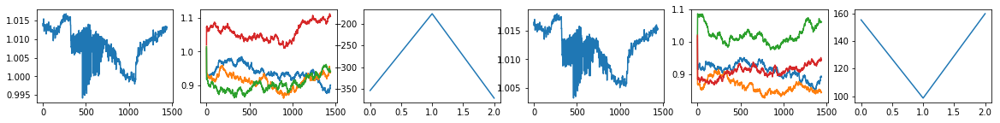

Agent: 2 | Defense | Reward: -309.828634 | Episode: 3 
Agent: 5 | Attack  | Reward: 130.889285 | Episode: 3 

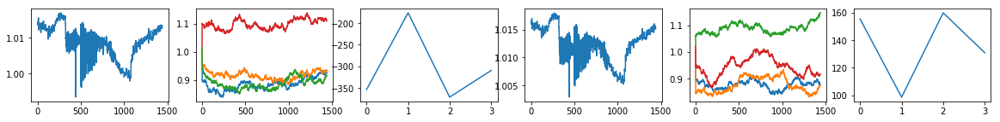

Agent: 2 | Defense | Reward: -327.684264 | Episode: 4 
Agent: 5 | Attack  | Reward: 145.483449 | Episode: 4 

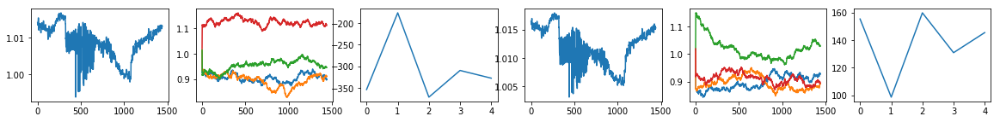

Agent: 2 | Defense | Reward: -425.731565 | Episode: 5 
Agent: 5 | Attack  | Reward: 167.186208 | Episode: 5 

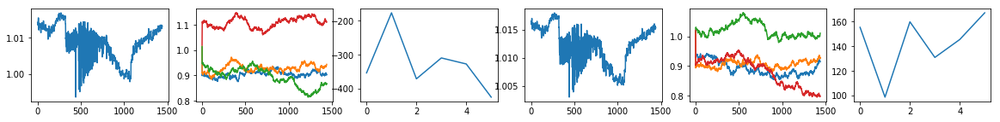

Agent: 2 | Defense | Reward: -322.104041 | Episode: 6 
Agent: 5 | Attack  | Reward: 134.716698 | Episode: 6 

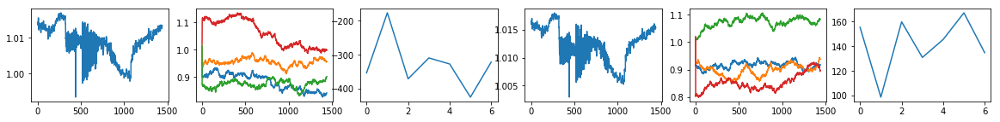

Agent: 2 | Defense | Reward: -186.142815 | Episode: 7 
Agent: 5 | Attack  | Reward: 93.307531 | Episode: 7 

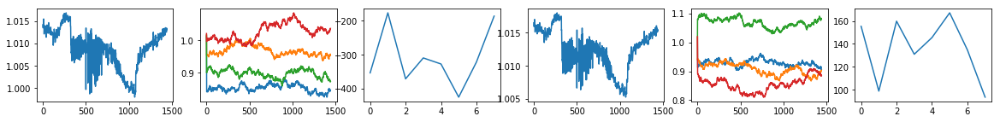

Agent: 2 | Defense | Reward: -213.003469 | Episode: 8 
Agent: 5 | Attack  | Reward: 103.823596 | Episode: 8 

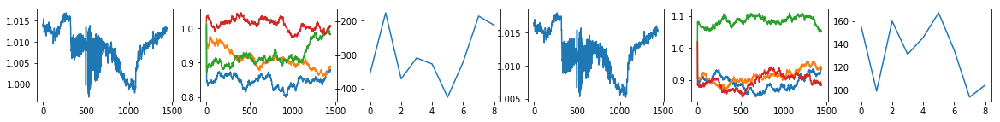

Agent: 2 | Defense | Reward: -306.250449 | Episode: 9 
Agent: 5 | Attack  | Reward: 131.967786 | Episode: 9 

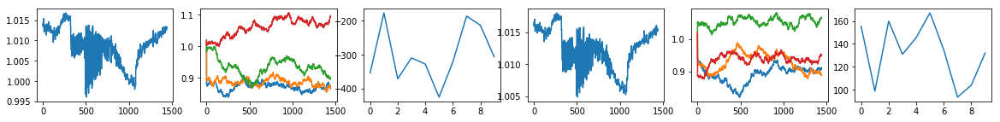

Agent: 2 | Defense | Reward: -318.233724 | Episode: 10 
Agent: 5 | Attack  | Reward: 136.327541 | Episode: 10 

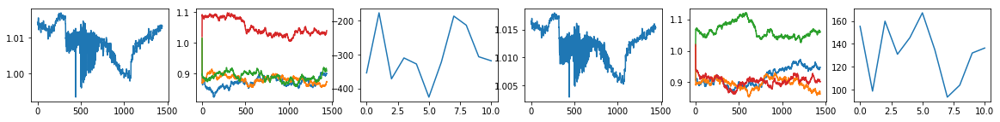

Agent: 2 | Defense | Reward: -175.099797 | Episode: 11 
Agent: 5 | Attack  | Reward: 92.007133 | Episode: 11 

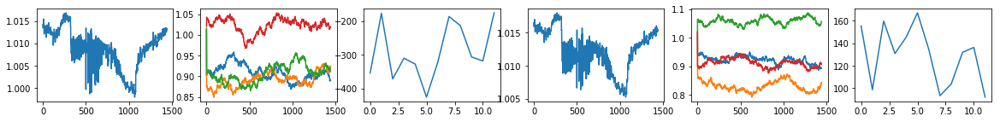

Agent: 2 | Defense | Reward: -177.815889 | Episode: 12 
Agent: 5 | Attack  | Reward: 92.183842 | Episode: 12 

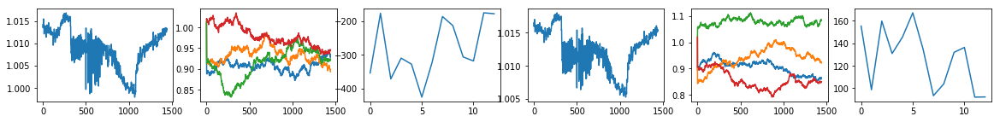

Agent: 2 | Defense | Reward: -278.308929 | Episode: 13 
Agent: 5 | Attack  | Reward: 127.850982 | Episode: 13 

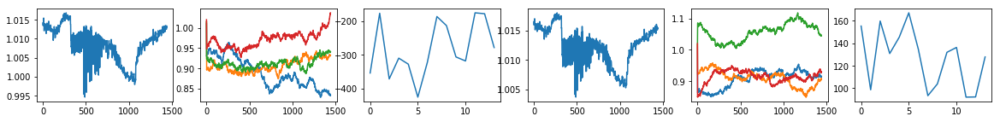

Agent: 2 | Defense | Reward: -240.680745 | Episode: 14 
Agent: 5 | Attack  | Reward: 110.334677 | Episode: 14 

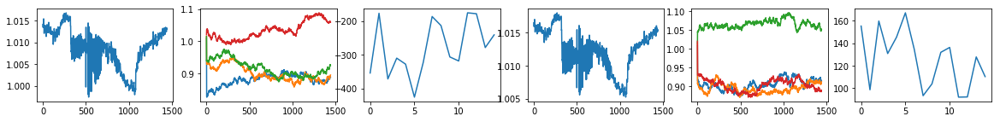

Agent: 2 | Defense | Reward: -218.061131 | Episode: 15 
Agent: 5 | Attack  | Reward: 118.219122 | Episode: 15 

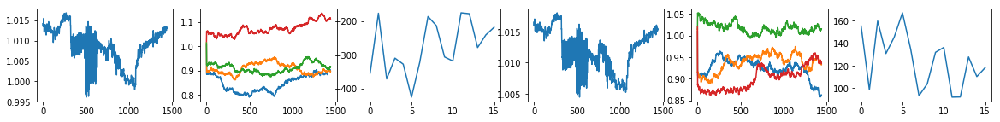

Agent: 2 | Defense | Reward: -373.310880 | Episode: 16 
Agent: 5 | Attack  | Reward: 153.526550 | Episode: 16 

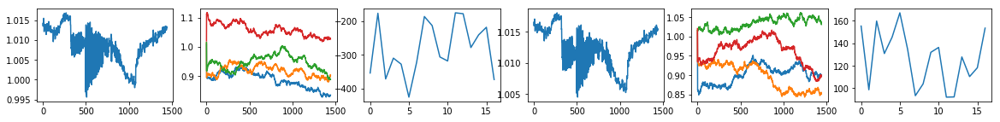

Agent: 2 | Defense | Reward: -179.412914 | Episode: 17 
Agent: 5 | Attack  | Reward: 92.398636 | Episode: 17 

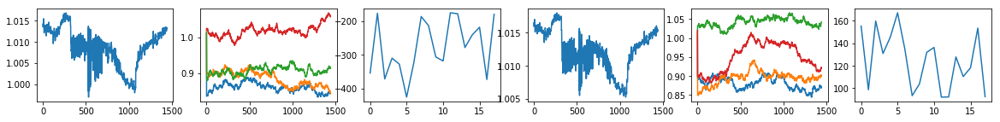

Agent: 2 | Defense | Reward: -284.451907 | Episode: 18 
Agent: 5 | Attack  | Reward: 124.841738 | Episode: 18 

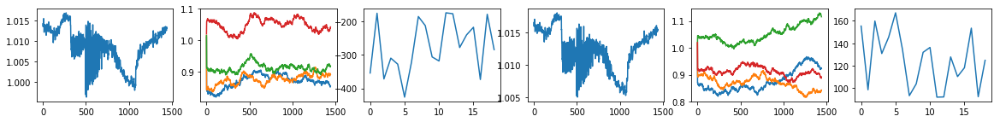

Agent: 2 | Defense | Reward: -373.533692 | Episode: 19 
Agent: 5 | Attack  | Reward: 149.949825 | Episode: 19 

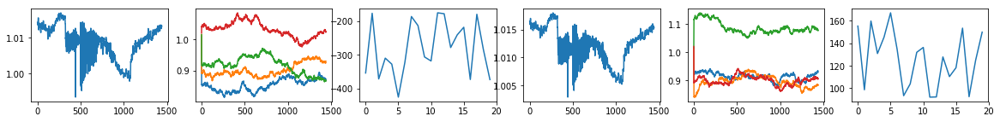

Agent: 2 | Defense | Reward: -177.811286 | Episode: 20 
Agent: 5 | Attack  | Reward: 92.096956 | Episode: 20 

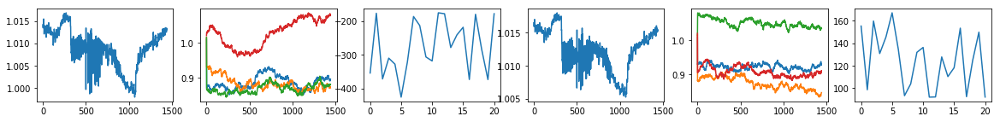

Agent: 2 | Defense | Reward: -304.894984 | Episode: 21 
Agent: 5 | Attack  | Reward: 132.311609 | Episode: 21 

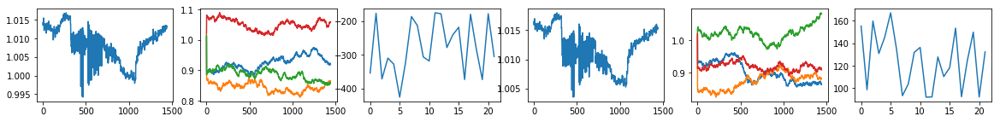

Agent: 2 | Defense | Reward: -196.319139 | Episode: 22 
Agent: 5 | Attack  | Reward: 96.494496 | Episode: 22 

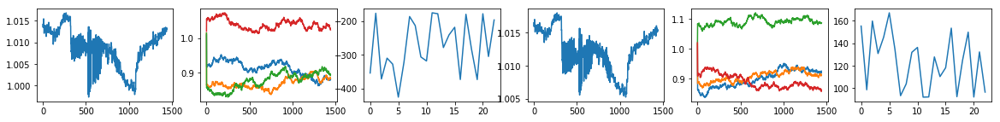

Agent: 2 | Defense | Reward: -313.422045 | Episode: 23 
Agent: 5 | Attack  | Reward: 134.352081 | Episode: 23 

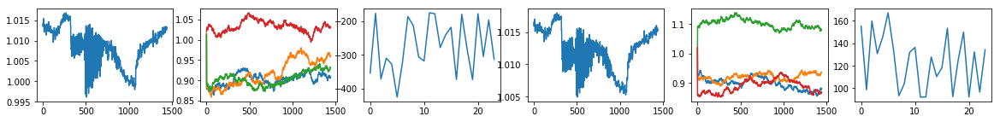

Agent: 2 | Defense | Reward: -309.110144 | Episode: 24 
Agent: 5 | Attack  | Reward: 133.898355 | Episode: 24 

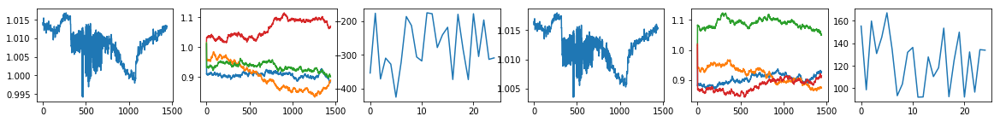

Agent: 2 | Defense | Reward: -313.381805 | Episode: 25 
Agent: 5 | Attack  | Reward: 133.443170 | Episode: 25 

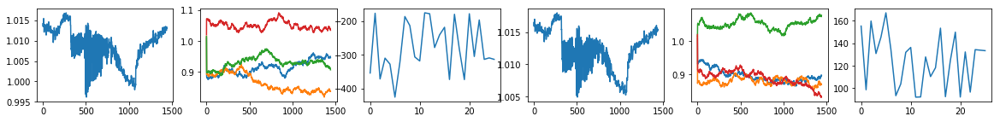

Agent: 2 | Defense | Reward: -329.761549 | Episode: 26 
Agent: 5 | Attack  | Reward: 140.002239 | Episode: 26 

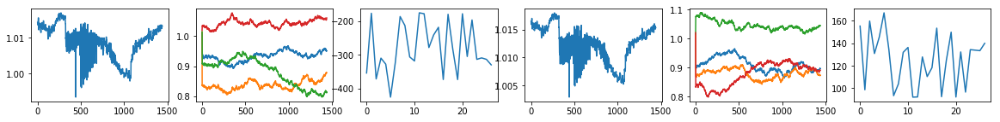

Agent: 2 | Defense | Reward: -321.080911 | Episode: 27 
Agent: 5 | Attack  | Reward: 136.597137 | Episode: 27 

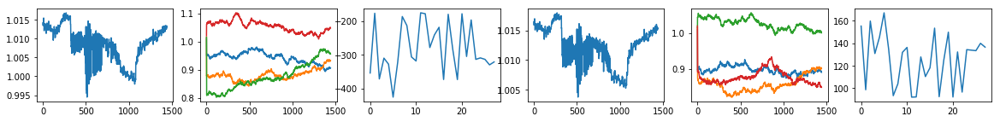

Agent: 2 | Defense | Reward: -328.076779 | Episode: 28 
Agent: 5 | Attack  | Reward: 144.839581 | Episode: 28 

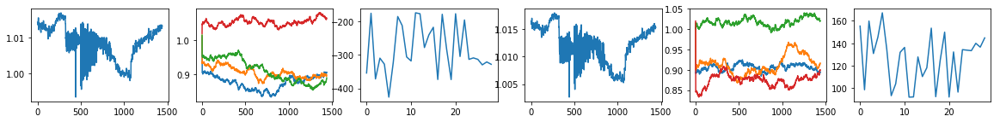

Agent: 2 | Defense | Reward: -229.441146 | Episode: 29 
Agent: 5 | Attack  | Reward: 105.524615 | Episode: 29 

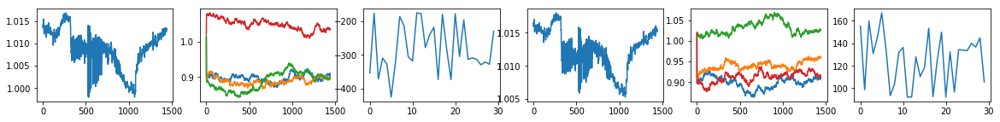

Agent: 2 | Defense | Reward: -300.102378 | Episode: 30 
Agent: 5 | Attack  | Reward: 129.280018 | Episode: 30 

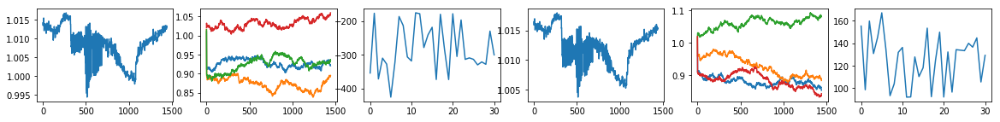

Agent: 2 | Defense | Reward: -397.184918 | Episode: 31 
Agent: 5 | Attack  | Reward: 161.280606 | Episode: 31 

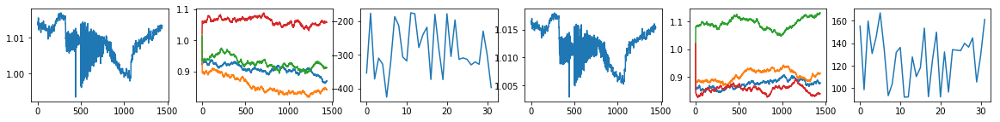

Agent: 2 | Defense | Reward: -327.931391 | Episode: 32 
Agent: 5 | Attack  | Reward: 136.490619 | Episode: 32 

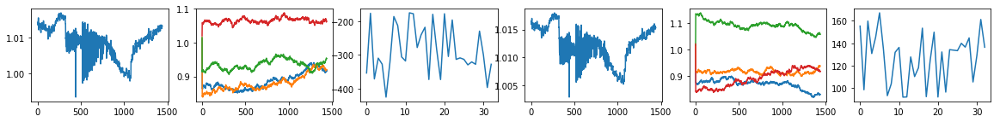

Agent: 2 | Defense | Reward: -378.075998 | Episode: 33 
Agent: 5 | Attack  | Reward: 152.524195 | Episode: 33 

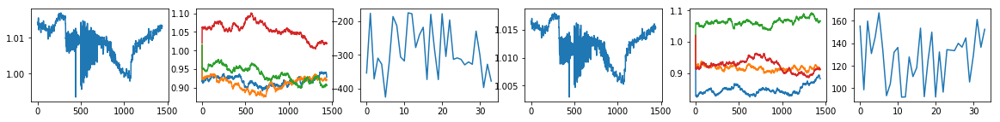

Agent: 2 | Defense | Reward: -177.811400 | Episode: 34 
Agent: 5 | Attack  | Reward: 92.182723 | Episode: 34 

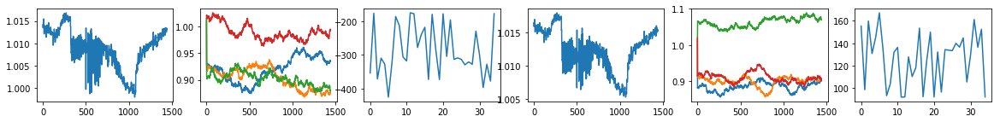

Agent: 2 | Defense | Reward: -180.904014 | Episode: 35 
Agent: 5 | Attack  | Reward: 92.872122 | Episode: 35 

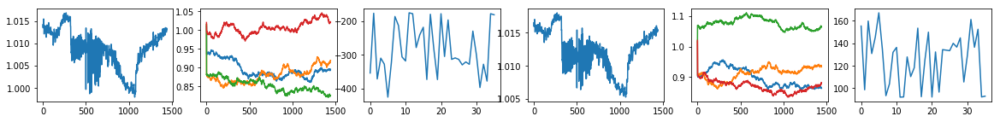

Agent: 2 | Defense | Reward: -277.407598 | Episode: 36 
Agent: 5 | Attack  | Reward: 122.906348 | Episode: 36 

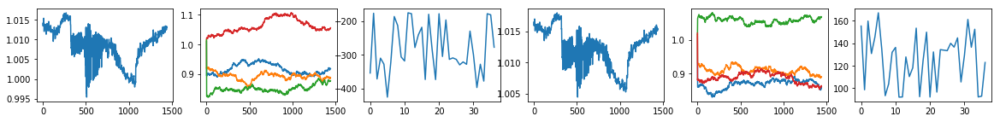

Agent: 2 | Defense | Reward: -324.773709 | Episode: 37 
Agent: 5 | Attack  | Reward: 137.414667 | Episode: 37 

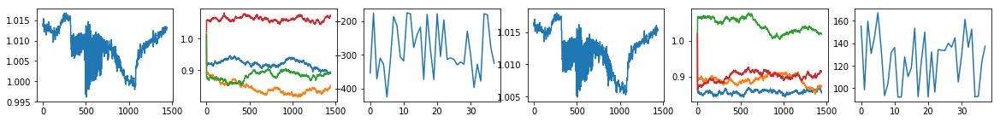

Agent: 2 | Defense | Reward: -371.863314 | Episode: 38 
Agent: 5 | Attack  | Reward: 154.125901 | Episode: 38 

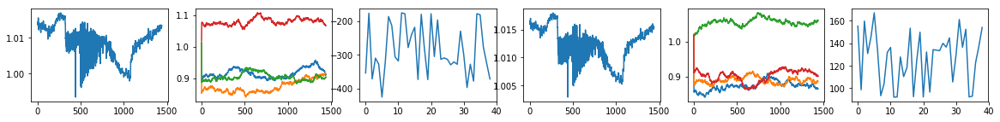

Agent: 2 | Defense | Reward: -306.200309 | Episode: 39 
Agent: 5 | Attack  | Reward: 132.629236 | Episode: 39 

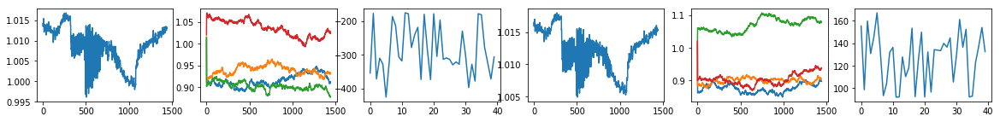

Agent: 2 | Defense | Reward: -293.271535 | Episode: 40 
Agent: 5 | Attack  | Reward: 127.471291 | Episode: 40 

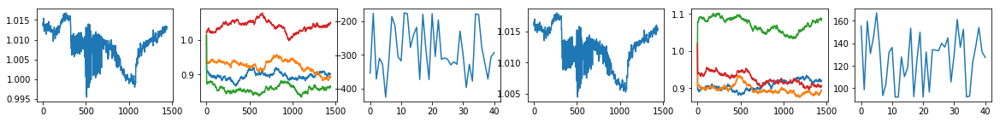

Agent: 2 | Defense | Reward: -190.813688 | Episode: 41 
Agent: 5 | Attack  | Reward: 96.411825 | Episode: 41 

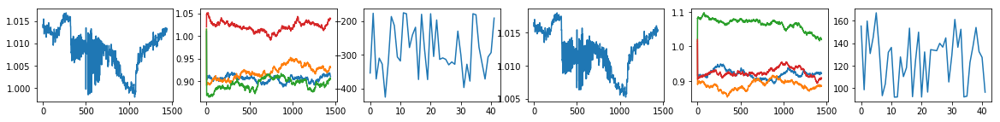

Agent: 2 | Defense | Reward: -134.076326 | Episode: 42 
Agent: 5 | Attack  | Reward: 88.140659 | Episode: 42 

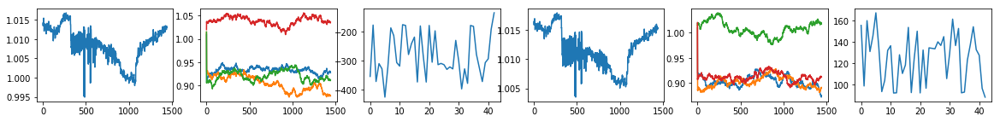

Agent: 2 | Defense | Reward: -227.751283 | Episode: 43 
Agent: 5 | Attack  | Reward: 107.877464 | Episode: 43 

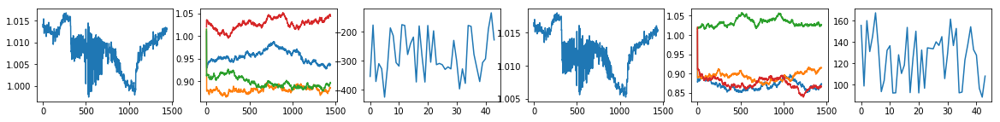

Agent: 2 | Defense | Reward: -220.841695 | Episode: 44 
Agent: 5 | Attack  | Reward: 102.989979 | Episode: 44 

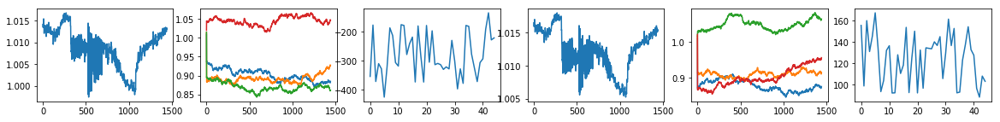

Agent: 2 | Defense | Reward: -237.254904 | Episode: 45 
Agent: 5 | Attack  | Reward: 109.947476 | Episode: 45 

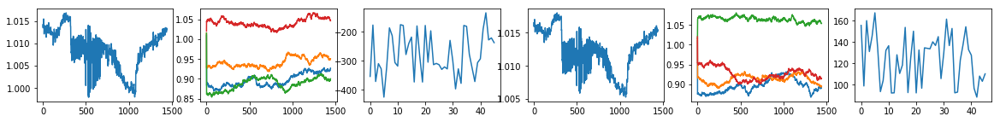

Agent: 2 | Defense | Reward: -271.827953 | Episode: 46 
Agent: 5 | Attack  | Reward: 120.947038 | Episode: 46 

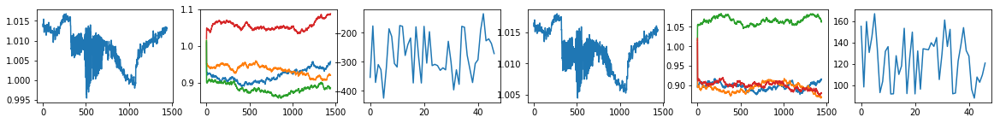

Agent: 2 | Defense | Reward: -265.835272 | Episode: 47 
Agent: 5 | Attack  | Reward: 120.206934 | Episode: 47 

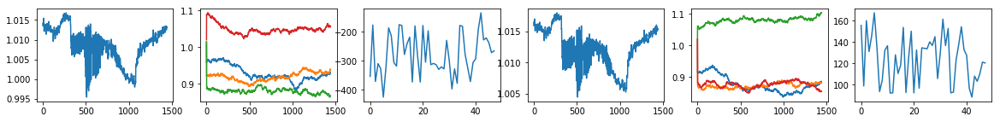

Agent: 2 | Defense | Reward: -290.028250 | Episode: 48 
Agent: 5 | Attack  | Reward: 125.886514 | Episode: 48 

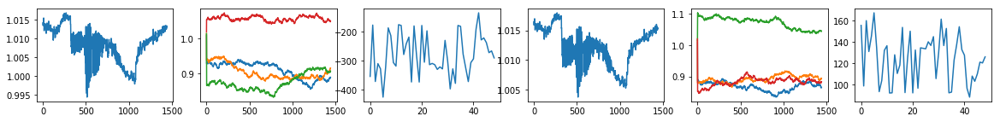

Agent: 2 | Defense | Reward: -326.056346 | Episode: 49 
Agent: 5 | Attack  | Reward: 146.441607 | Episode: 49 

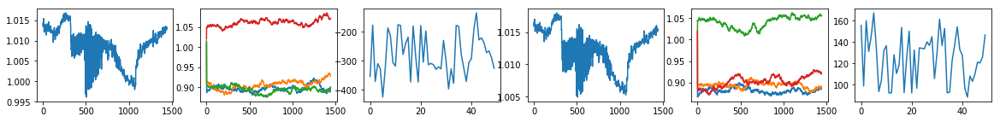

Agent: 2 | Defense | Reward: -307.167545 | Episode: 50 
Agent: 5 | Attack  | Reward: 132.296710 | Episode: 50 

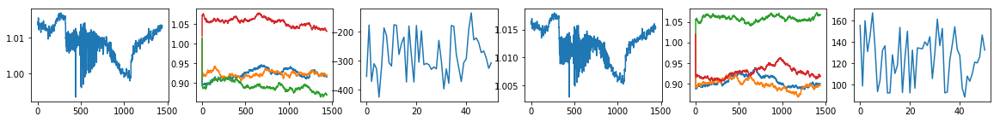

Agent: 2 | Defense | Reward: -232.511163 | Episode: 51 
Agent: 5 | Attack  | Reward: 107.532345 | Episode: 51 

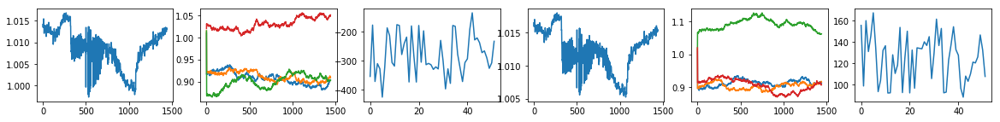

Agent: 2 | Defense | Reward: -226.789187 | Episode: 52 
Agent: 5 | Attack  | Reward: 114.255884 | Episode: 52 

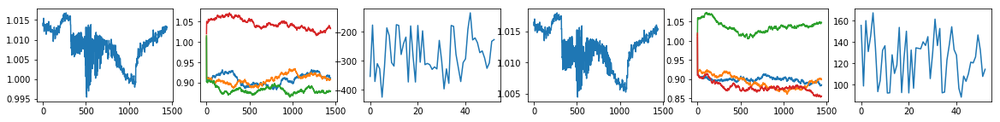

Agent: 2 | Defense | Reward: -235.024455 | Episode: 53 
Agent: 5 | Attack  | Reward: 106.980564 | Episode: 53 

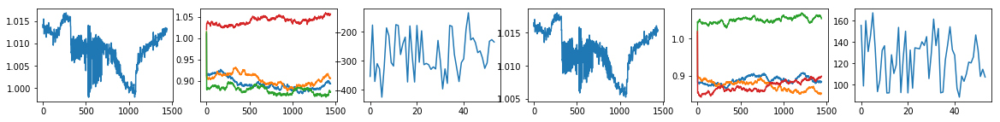

Agent: 2 | Defense | Reward: -225.231975 | Episode: 54 
Agent: 5 | Attack  | Reward: 107.264409 | Episode: 54 

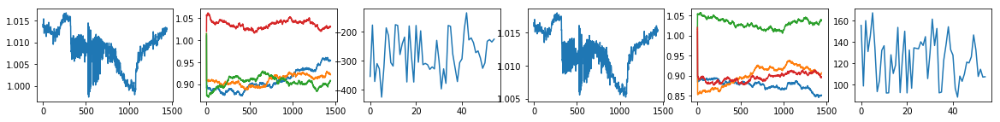

Agent: 2 | Defense | Reward: -287.256777 | Episode: 55 
Agent: 5 | Attack  | Reward: 125.427545 | Episode: 55 

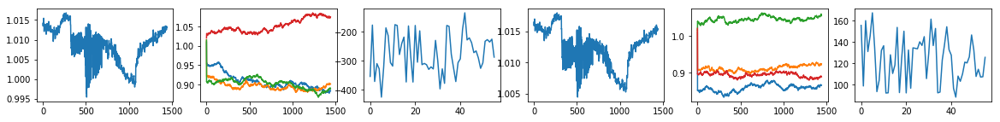

Agent: 2 | Defense | Reward: -365.121280 | Episode: 56 
Agent: 5 | Attack  | Reward: 150.880903 | Episode: 56 

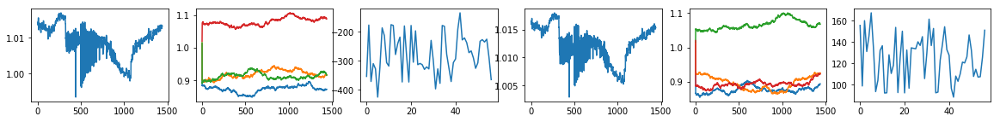

Agent: 2 | Defense | Reward: -297.563724 | Episode: 57 
Agent: 5 | Attack  | Reward: 128.790392 | Episode: 57 

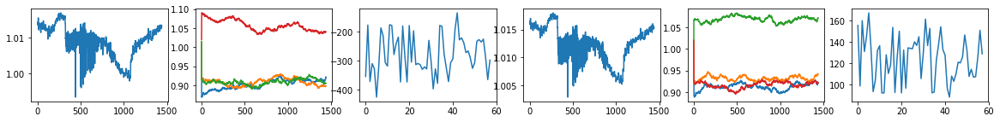

Agent: 2 | Defense | Reward: -262.917380 | Episode: 58 
Agent: 5 | Attack  | Reward: 118.086144 | Episode: 58 

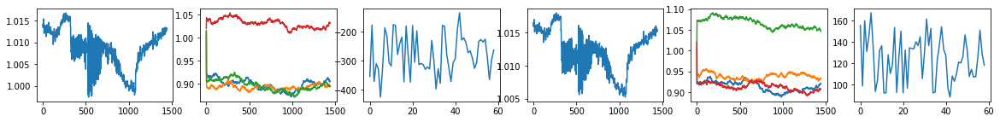

Agent: 2 | Defense | Reward: -290.651495 | Episode: 59 
Agent: 5 | Attack  | Reward: 126.374083 | Episode: 59 

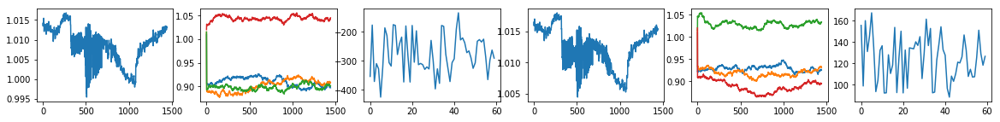

Agent: 2 | Defense | Reward: -354.606742 | Episode: 60 
Agent: 5 | Attack  | Reward: 149.552459 | Episode: 60 

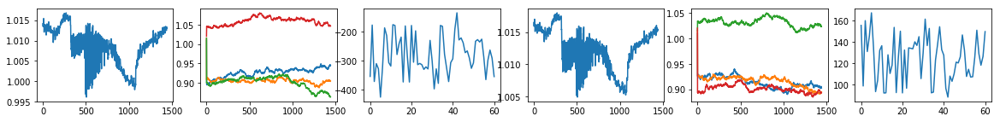

Agent: 2 | Defense | Reward: -296.291889 | Episode: 61 
Agent: 5 | Attack  | Reward: 127.250329 | Episode: 61 

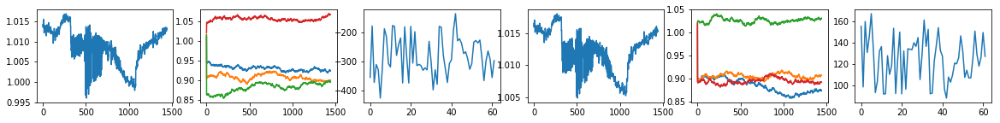

Agent: 2 | Defense | Reward: -261.811994 | Episode: 62 
Agent: 5 | Attack  | Reward: 116.604817 | Episode: 62 

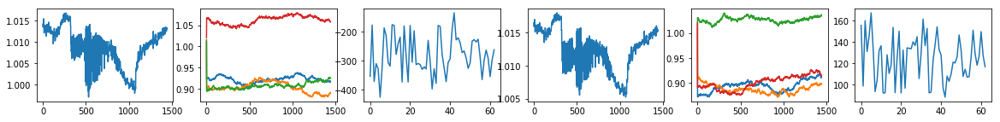

Agent: 2 | Defense | Reward: -350.741400 | Episode: 63 
Agent: 5 | Attack  | Reward: 148.330139 | Episode: 63 

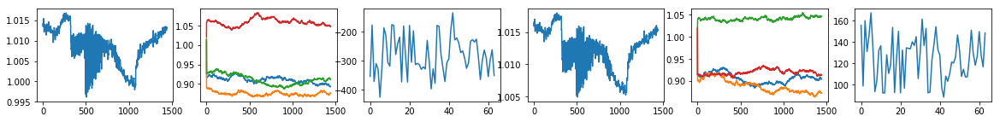

Agent: 2 | Defense | Reward: -314.445819 | Episode: 64 
Agent: 5 | Attack  | Reward: 135.407582 | Episode: 64 

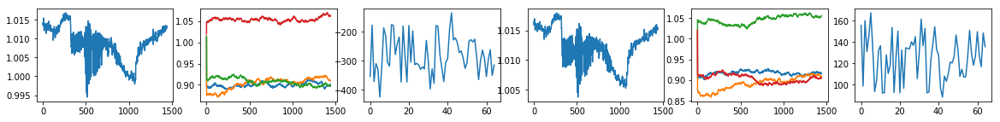

Agent: 2 | Defense | Reward: -317.569556 | Episode: 65 
Agent: 5 | Attack  | Reward: 136.246286 | Episode: 65 

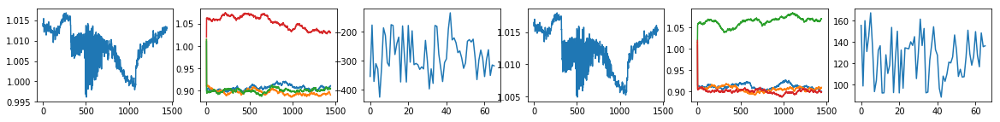

Agent: 2 | Defense | Reward: -283.724299 | Episode: 66 
Agent: 5 | Attack  | Reward: 123.565677 | Episode: 66 

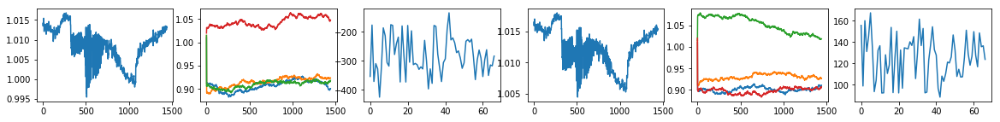

Agent: 2 | Defense | Reward: -283.866515 | Episode: 67 
Agent: 5 | Attack  | Reward: 123.584247 | Episode: 67 

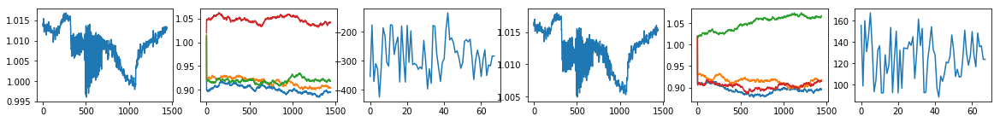

Agent: 2 | Defense | Reward: -292.041645 | Episode: 68 
Agent: 5 | Attack  | Reward: 128.706604 | Episode: 68 

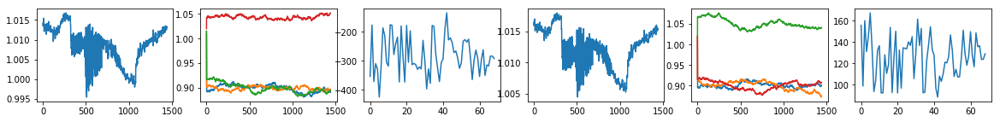

Agent: 2 | Defense | Reward: -296.784115 | Episode: 69 
Agent: 5 | Attack  | Reward: 127.685354 | Episode: 69 

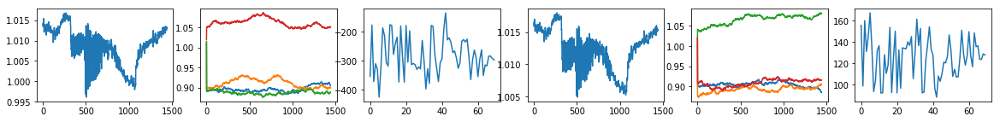

Agent: 2 | Defense | Reward: -295.224307 | Episode: 70 
Agent: 5 | Attack  | Reward: 125.865153 | Episode: 70 

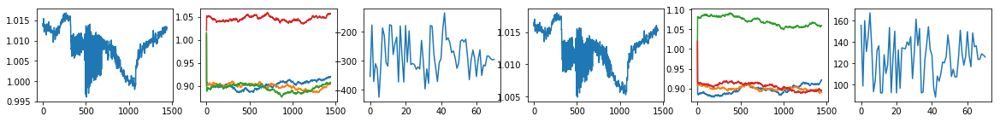

Agent: 2 | Defense | Reward: -304.818604 | Episode: 71 
Agent: 5 | Attack  | Reward: 130.276263 | Episode: 71 

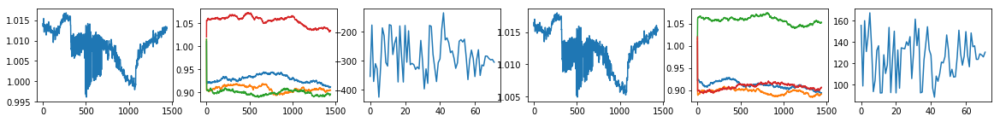

Agent: 2 | Defense | Reward: -240.194122 | Episode: 72 
Agent: 5 | Attack  | Reward: 109.126445 | Episode: 72 

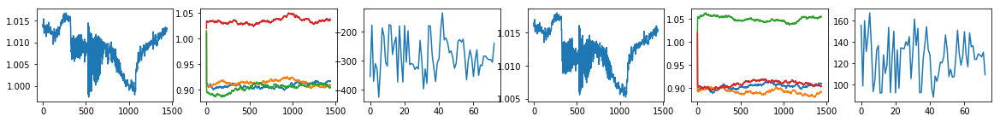

Agent: 2 | Defense | Reward: -231.993578 | Episode: 73 
Agent: 5 | Attack  | Reward: 107.671717 | Episode: 73 

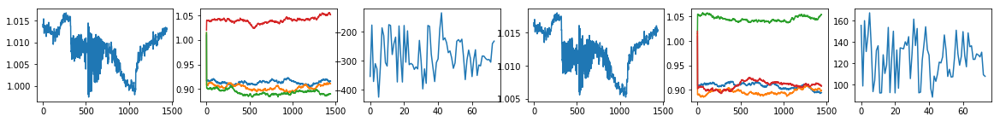

Agent: 2 | Defense | Reward: -319.444350 | Episode: 74 
Agent: 5 | Attack  | Reward: 134.980568 | Episode: 74 

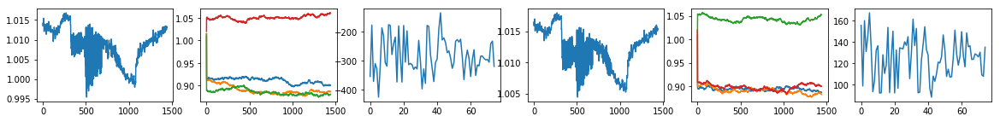

Agent: 2 | Defense | Reward: -278.201261 | Episode: 75 
Agent: 5 | Attack  | Reward: 122.377843 | Episode: 75 

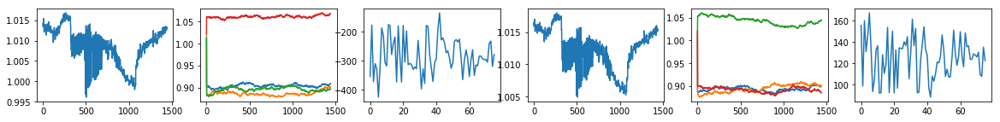

Agent: 2 | Defense | Reward: -349.558396 | Episode: 76 
Agent: 5 | Attack  | Reward: 147.765033 | Episode: 76 

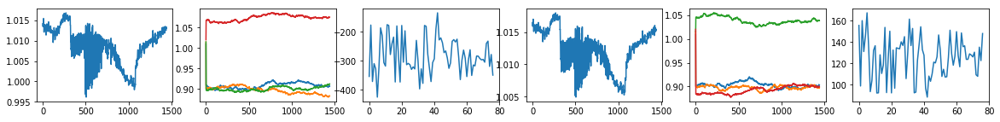

Agent: 2 | Defense | Reward: -398.004582 | Episode: 77 
Agent: 5 | Attack  | Reward: 158.972024 | Episode: 77 

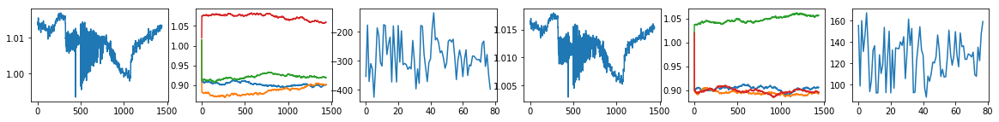

Agent: 2 | Defense | Reward: -306.582800 | Episode: 78 
Agent: 5 | Attack  | Reward: 130.101690 | Episode: 78 

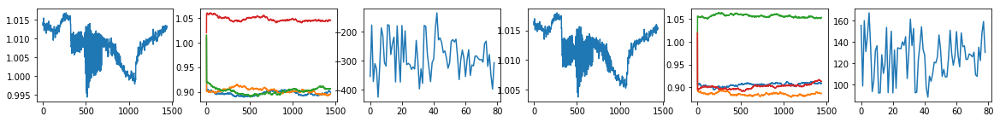

Agent: 2 | Defense | Reward: -300.297033 | Episode: 79 
Agent: 5 | Attack  | Reward: 129.016863 | Episode: 79 

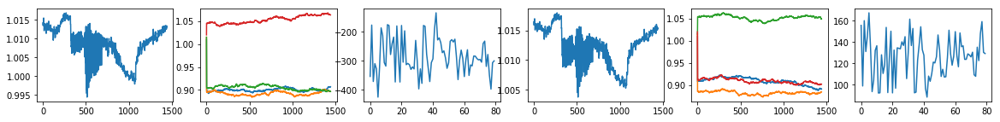

Agent: 2 | Defense | Reward: -306.210542 | Episode: 80 
Agent: 5 | Attack  | Reward: 129.338755 | Episode: 80 

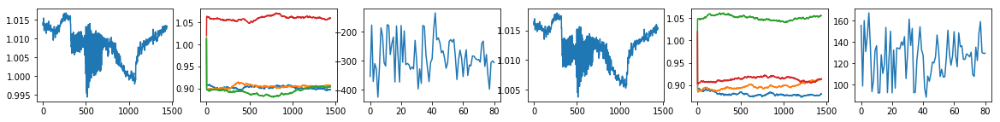

Agent: 2 | Defense | Reward: -303.283613 | Episode: 81 
Agent: 5 | Attack  | Reward: 130.458688 | Episode: 81 

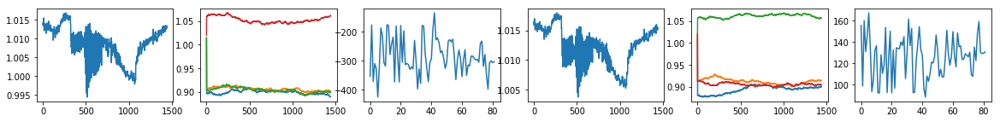

Agent: 2 | Defense | Reward: -296.842689 | Episode: 82 
Agent: 5 | Attack  | Reward: 129.775204 | Episode: 82 

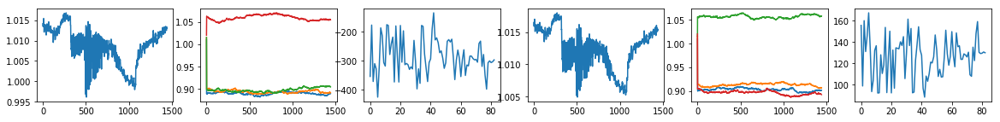

Agent: 2 | Defense | Reward: -306.229157 | Episode: 83 
Agent: 5 | Attack  | Reward: 129.583953 | Episode: 83 

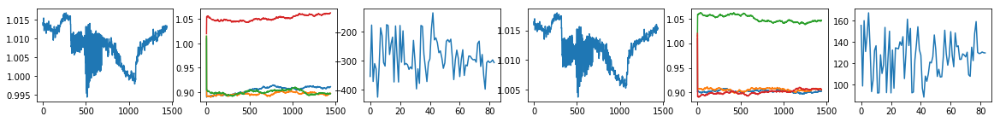

Agent: 2 | Defense | Reward: -306.583461 | Episode: 84 
Agent: 5 | Attack  | Reward: 130.378042 | Episode: 84 

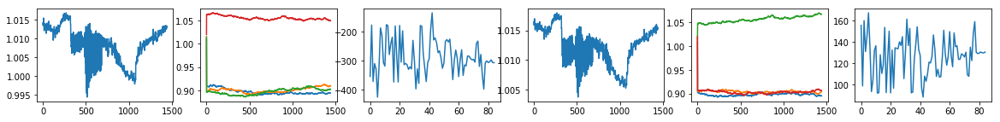

Agent: 2 | Defense | Reward: -297.841456 | Episode: 85 
Agent: 5 | Attack  | Reward: 127.265224 | Episode: 85 

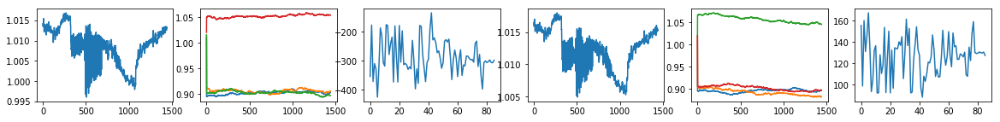

Agent: 2 | Defense | Reward: -299.471997 | Episode: 86 
Agent: 5 | Attack  | Reward: 128.706943 | Episode: 86 

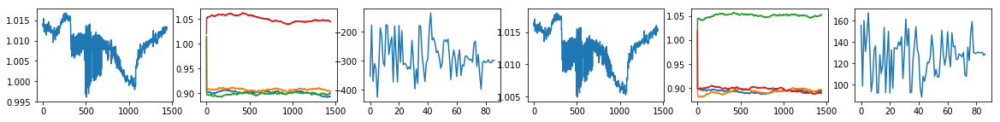

Agent: 2 | Defense | Reward: -285.023000 | Episode: 87 
Agent: 5 | Attack  | Reward: 125.286914 | Episode: 87 

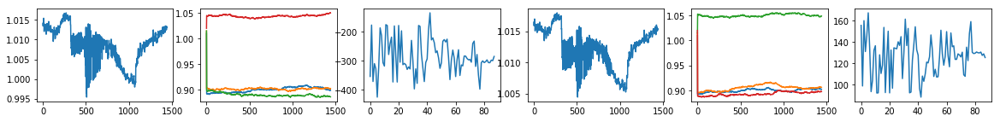

Agent: 2 | Defense | Reward: -323.484253 | Episode: 88 
Agent: 5 | Attack  | Reward: 136.678032 | Episode: 88 

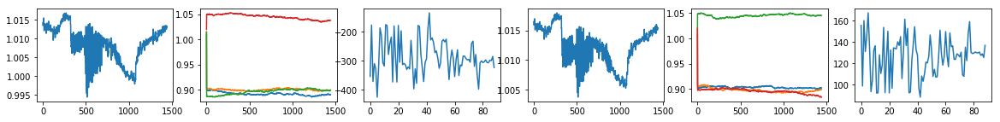

Agent: 2 | Defense | Reward: -302.831708 | Episode: 89 
Agent: 5 | Attack  | Reward: 131.011514 | Episode: 89 

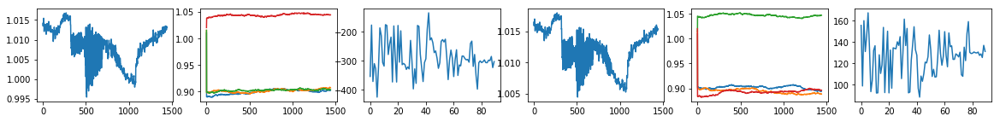

Agent: 2 | Defense | Reward: -321.107655 | Episode: 90 
Agent: 5 | Attack  | Reward: 135.704215 | Episode: 90 

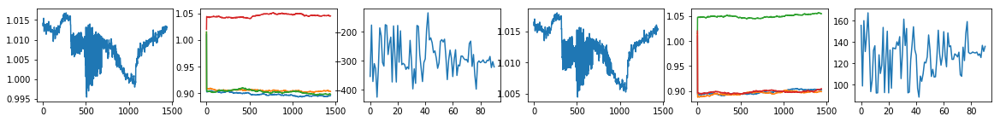

Agent: 2 | Defense | Reward: -319.611699 | Episode: 91 
Agent: 5 | Attack  | Reward: 134.549985 | Episode: 91 

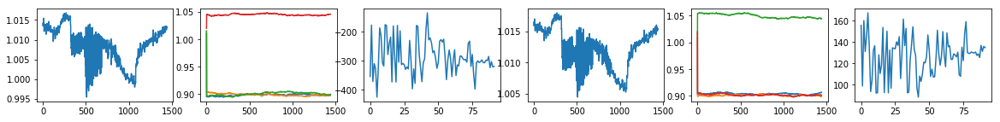

Agent: 2 | Defense | Reward: -298.248224 | Episode: 92 
Agent: 5 | Attack  | Reward: 127.361124 | Episode: 92 

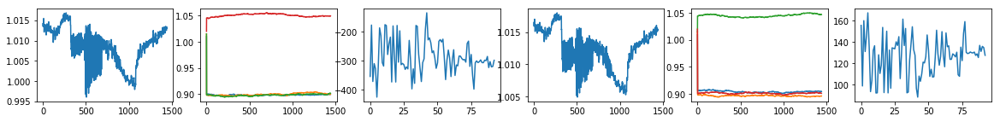

Agent: 2 | Defense | Reward: -301.937048 | Episode: 93 
Agent: 5 | Attack  | Reward: 129.303146 | Episode: 93 

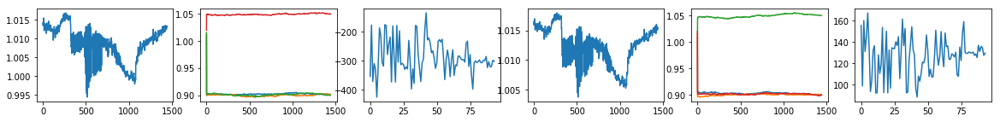

Agent: 2 | Defense | Reward: -306.661746 | Episode: 94 
Agent: 5 | Attack  | Reward: 130.612151 | Episode: 94 

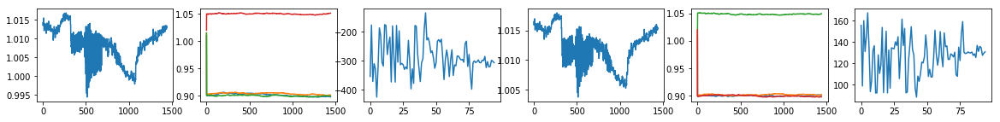

Agent: 2 | Defense | Reward: -298.295249 | Episode: 95 
Agent: 5 | Attack  | Reward: 127.374494 | Episode: 95 

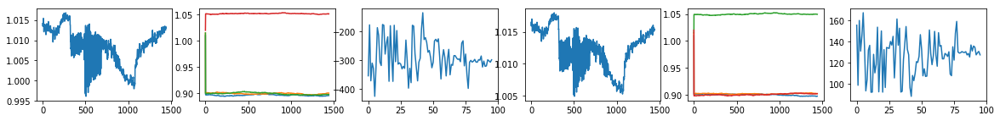

Agent: 2 | Defense | Reward: -301.916916 | Episode: 96 
Agent: 5 | Attack  | Reward: 130.231431 | Episode: 96 

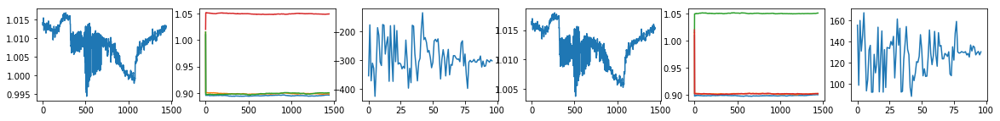

Agent: 2 | Defense | Reward: -301.936113 | Episode: 97 
Agent: 5 | Attack  | Reward: 129.302198 | Episode: 97 

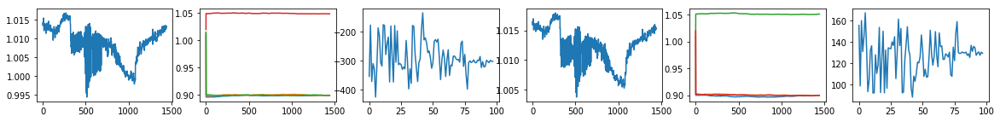

Agent: 2 | Defense | Reward: -301.942147 | Episode: 98 
Agent: 5 | Attack  | Reward: 130.238087 | Episode: 98 

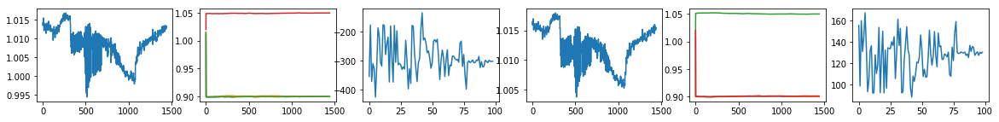

Agent: 2 | Defense | Reward: -306.663339 | Episode: 99 
Agent: 5 | Attack  | Reward: 130.532980 | Episode: 99 

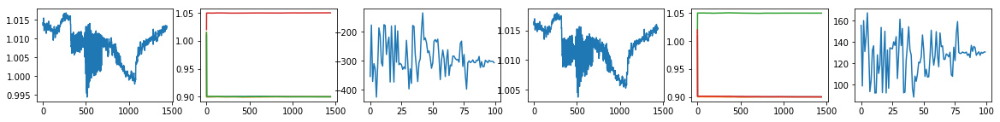

Agent: 2 | Defense | Reward: -306.660257 | Episode: 100 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 100 

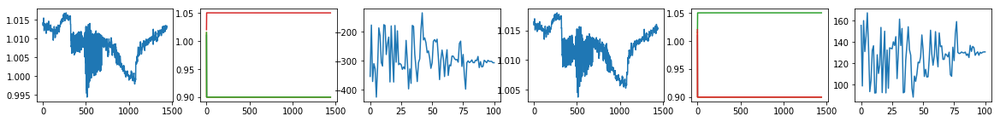

Agent: 2 | Defense | Reward: -306.660257 | Episode: 101 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 101 

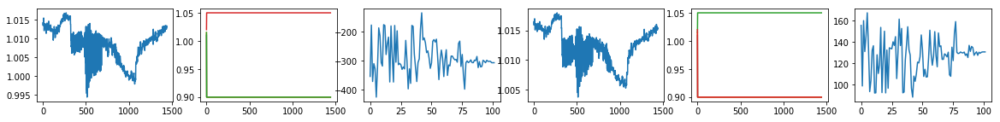

Agent: 2 | Defense | Reward: -306.660257 | Episode: 102 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 102 

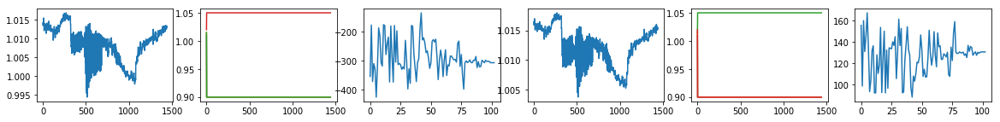

Agent: 2 | Defense | Reward: -306.660257 | Episode: 103 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 103 

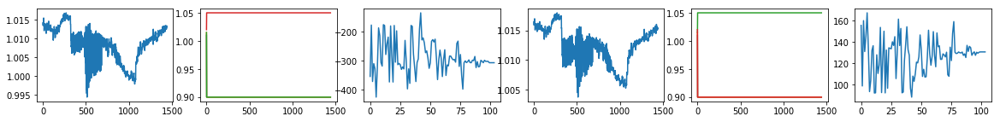

Agent: 2 | Defense | Reward: -306.660257 | Episode: 104 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 104 

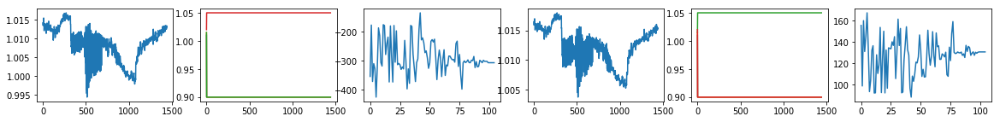

Agent: 2 | Defense | Reward: -306.660257 | Episode: 105 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 105 

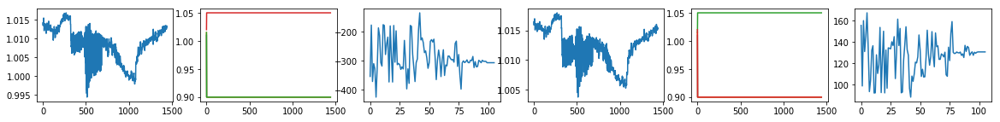

Agent: 2 | Defense | Reward: -306.660257 | Episode: 106 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 106 

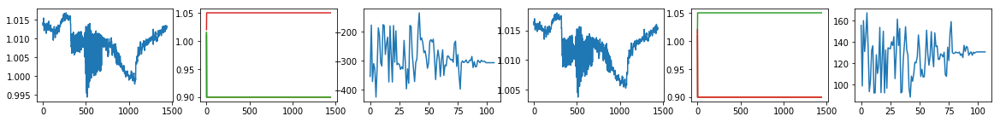

Agent: 2 | Defense | Reward: -306.660257 | Episode: 107 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 107 

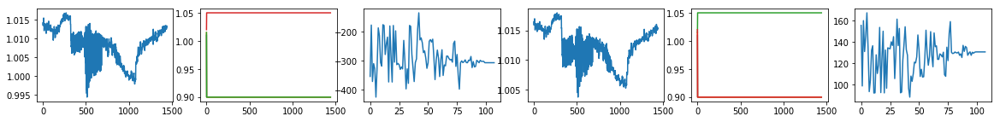

Agent: 2 | Defense | Reward: -306.660257 | Episode: 108 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 108 

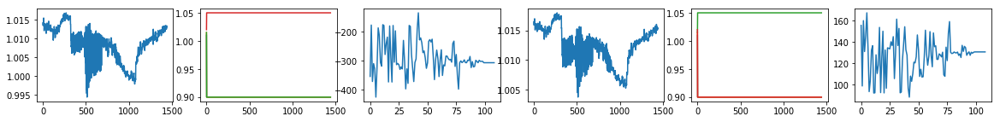

Agent: 2 | Defense | Reward: -306.660257 | Episode: 109 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 109 

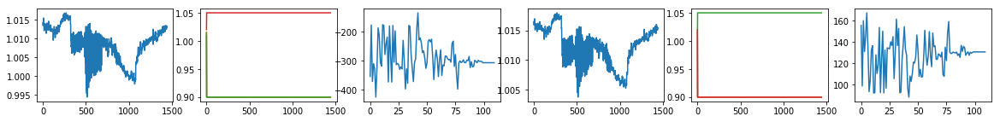

Agent: 2 | Defense | Reward: -306.660257 | Episode: 110 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 110 

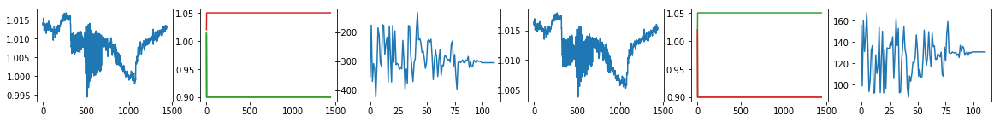

Agent: 2 | Defense | Reward: -306.660257 | Episode: 111 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 111 

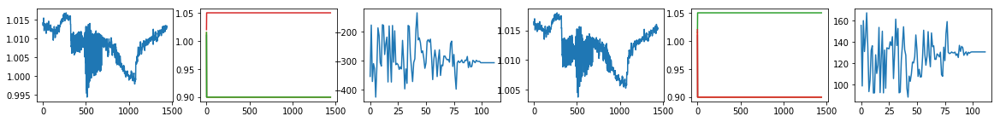

Agent: 2 | Defense | Reward: -306.660257 | Episode: 112 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 112 

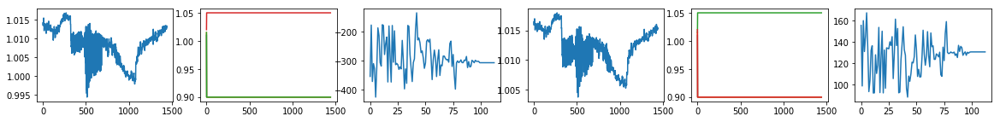

Agent: 2 | Defense | Reward: -306.660257 | Episode: 113 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 113 

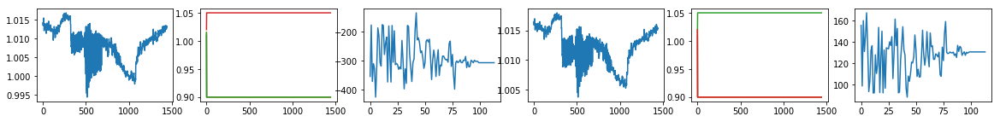

Agent: 2 | Defense | Reward: -306.660257 | Episode: 114 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 114 

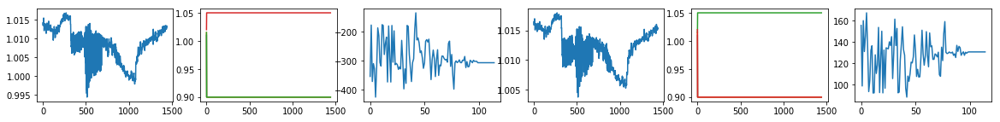

Agent: 2 | Defense | Reward: -306.660257 | Episode: 115 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 115 

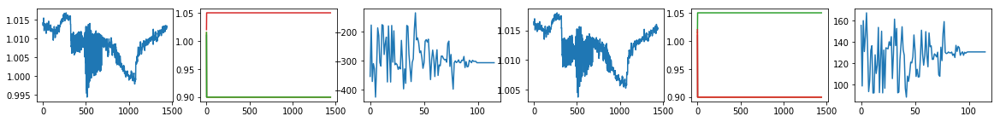

Agent: 2 | Defense | Reward: -306.660257 | Episode: 116 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 116 

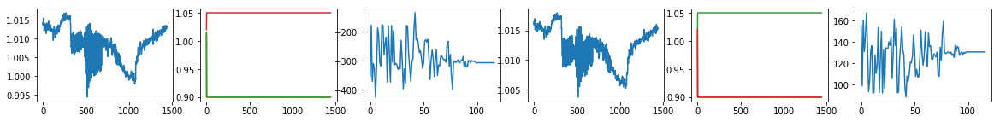

Agent: 2 | Defense | Reward: -306.660257 | Episode: 117 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 117 

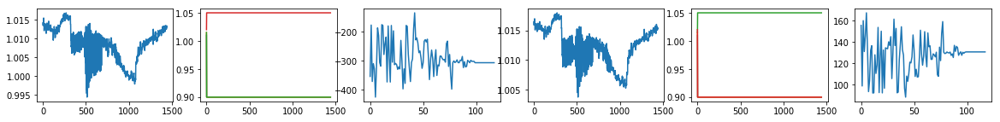

Agent: 2 | Defense | Reward: -306.660257 | Episode: 118 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 118 

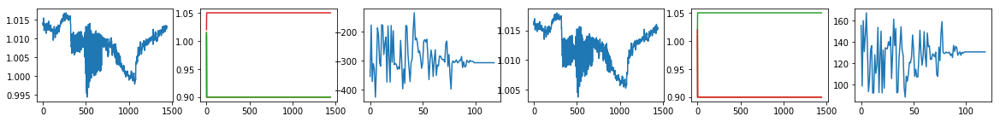

Agent: 2 | Defense | Reward: -306.660257 | Episode: 119 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 119 

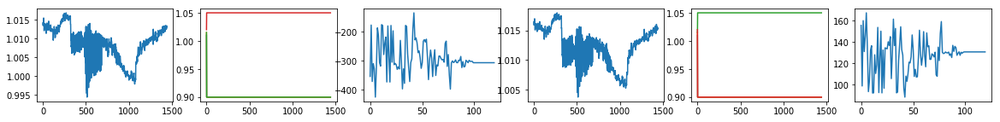

Agent: 2 | Defense | Reward: -306.660257 | Episode: 120 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 120 

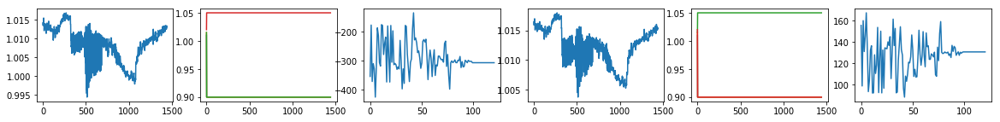

Agent: 2 | Defense | Reward: -306.660257 | Episode: 121 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 121 

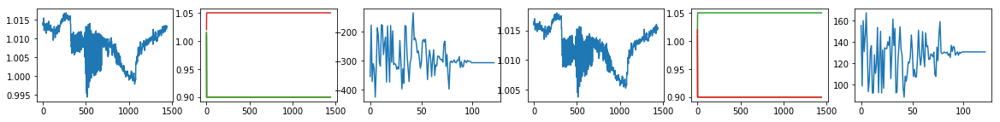

Agent: 2 | Defense | Reward: -306.660257 | Episode: 122 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 122 

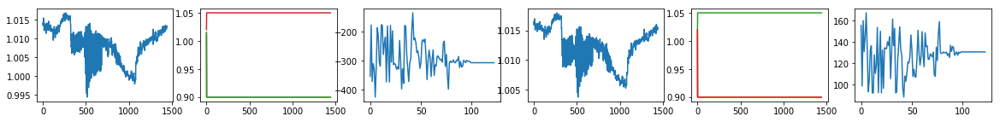

Agent: 2 | Defense | Reward: -306.660257 | Episode: 123 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 123 

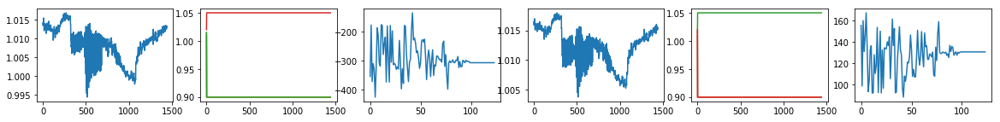

Agent: 2 | Defense | Reward: -306.660257 | Episode: 124 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 124 

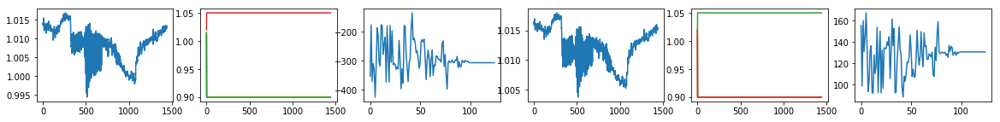

Agent: 2 | Defense | Reward: -306.660257 | Episode: 125 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 125 

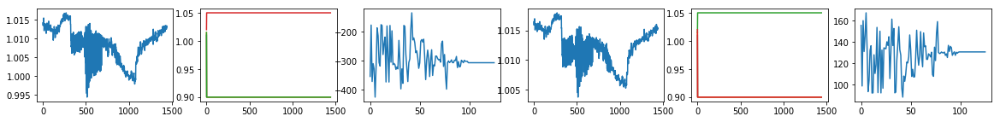

Agent: 2 | Defense | Reward: -306.660257 | Episode: 126 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 126 

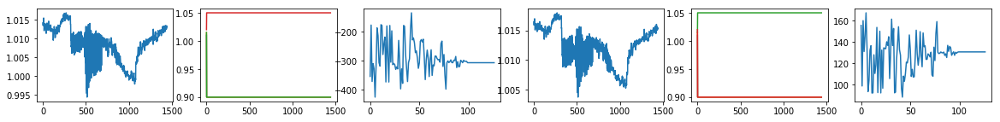

Agent: 2 | Defense | Reward: -306.660257 | Episode: 127 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 127 

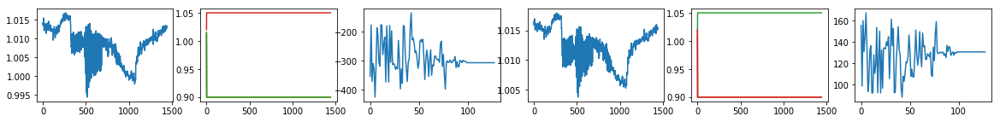

Agent: 2 | Defense | Reward: -306.660257 | Episode: 128 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 128 

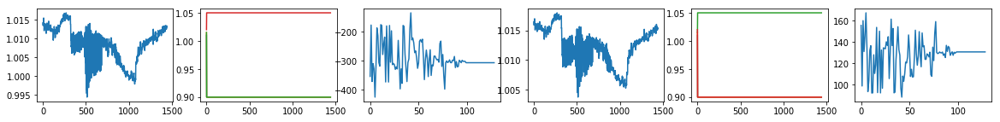

Agent: 2 | Defense | Reward: -306.660257 | Episode: 129 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 129 

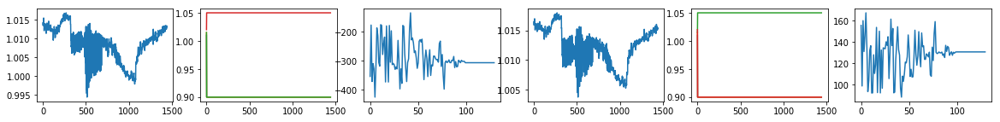

Agent: 2 | Defense | Reward: -306.660257 | Episode: 130 
Agent: 5 | Attack  | Reward: 130.532054 | Episode: 130 

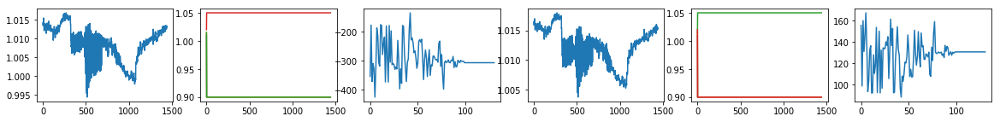

In [ ]:
import tensorflow as tf
import tflearn
import copy
main()

C:\Users\Sy-Toan\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


curses is not supported on this machine (please install/reinstall curses for an optimal experience)
Agent: 2 | Defense | Reward: -682.732460 | Episode: 0 
Agent: 5 | Attack  | Reward: 266.671616 | Episode: 0 

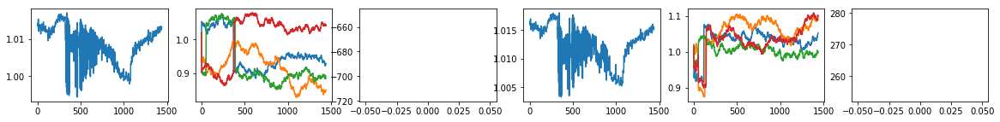

Agent: 2 | Defense | Reward: -542.454374 | Episode: 1 
Agent: 5 | Attack  | Reward: 201.642069 | Episode: 1 

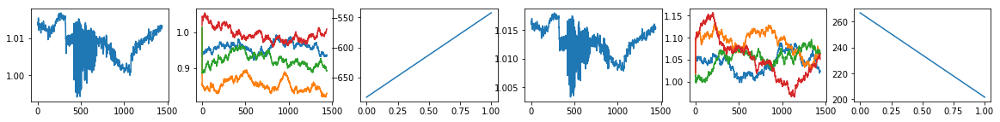

Agent: 2 | Defense | Reward: -333.490713 | Episode: 2 
Agent: 5 | Attack  | Reward: 156.053818 | Episode: 2 

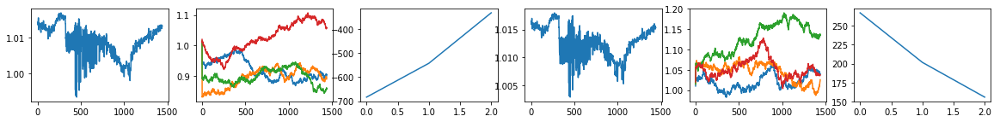

Agent: 2 | Defense | Reward: -562.748149 | Episode: 3 
Agent: 5 | Attack  | Reward: 181.219709 | Episode: 3 

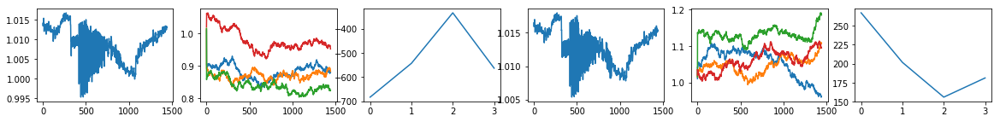

Agent: 2 | Defense | Reward: -218.588912 | Episode: 4 
Agent: 5 | Attack  | Reward: 104.890835 | Episode: 4 

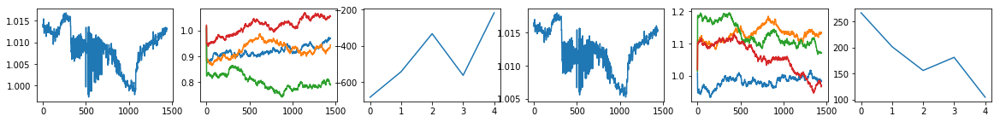

Agent: 2 | Defense | Reward: -326.569533 | Episode: 5 
Agent: 5 | Attack  | Reward: 140.568123 | Episode: 5 

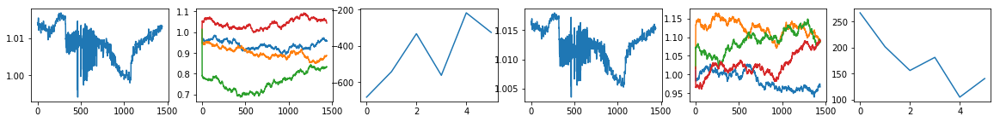

Agent: 2 | Defense | Reward: -633.930105 | Episode: 6 
Agent: 5 | Attack  | Reward: 215.688878 | Episode: 6 

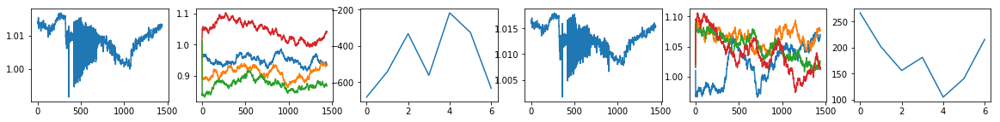

Agent: 2 | Defense | Reward: -555.741904 | Episode: 7 
Agent: 5 | Attack  | Reward: 194.417686 | Episode: 7 

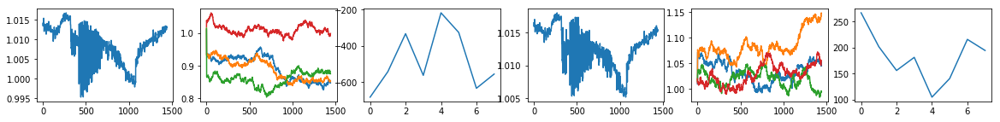

Agent: 2 | Defense | Reward: -165.391214 | Episode: 8 
Agent: 5 | Attack  | Reward: 91.991692 | Episode: 8 

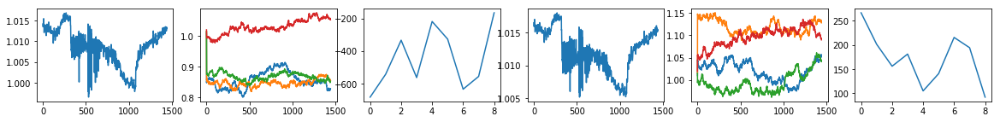

Agent: 2 | Defense | Reward: -600.173342 | Episode: 9 
Agent: 5 | Attack  | Reward: 195.919877 | Episode: 9 

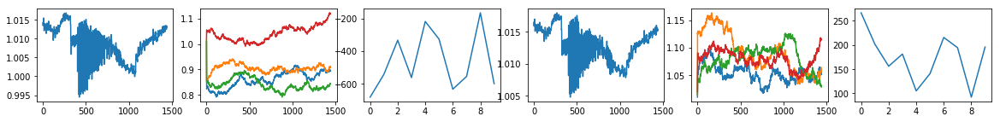

Agent: 2 | Defense | Reward: -605.452327 | Episode: 10 
Agent: 5 | Attack  | Reward: 197.830308 | Episode: 10 

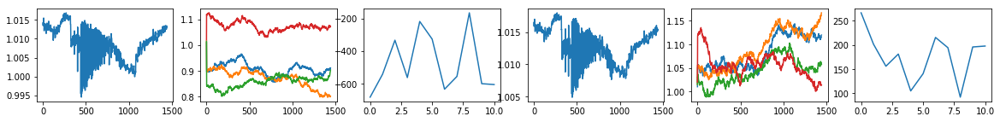

Agent: 2 | Defense | Reward: -639.249140 | Episode: 11 
Agent: 5 | Attack  | Reward: 203.417187 | Episode: 11 

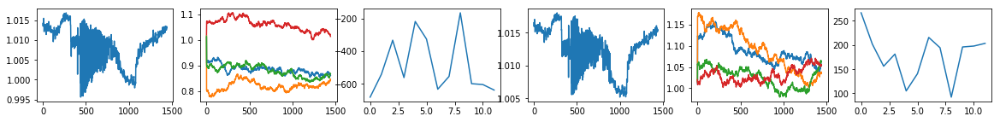

Agent: 2 | Defense | Reward: -296.387937 | Episode: 12 
Agent: 5 | Attack  | Reward: 129.302600 | Episode: 12 

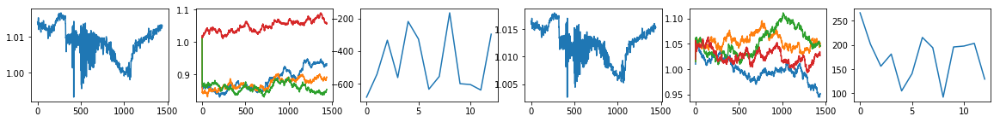

Agent: 2 | Defense | Reward: -640.888076 | Episode: 13 
Agent: 5 | Attack  | Reward: 209.737240 | Episode: 13 

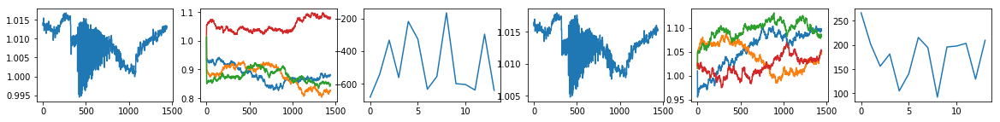

Agent: 2 | Defense | Reward: -651.321876 | Episode: 14 
Agent: 5 | Attack  | Reward: 208.862652 | Episode: 14 

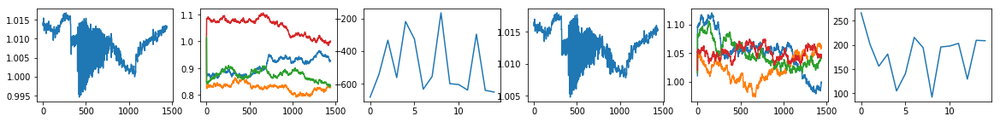

Agent: 2 | Defense | Reward: -383.937631 | Episode: 15 
Agent: 5 | Attack  | Reward: 159.428056 | Episode: 15 

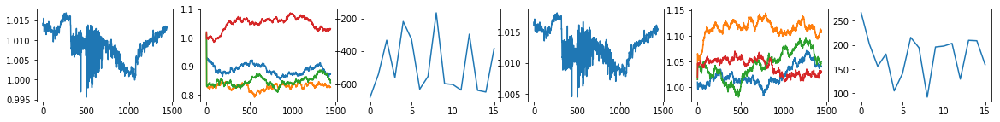

Agent: 2 | Defense | Reward: -329.578184 | Episode: 16 
Agent: 5 | Attack  | Reward: 160.759577 | Episode: 16 

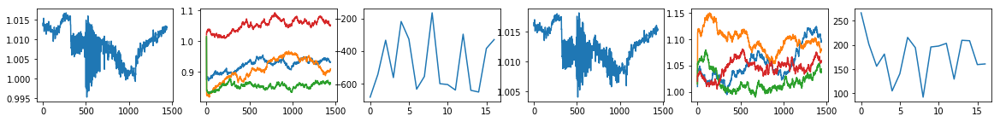

Agent: 2 | Defense | Reward: -274.488914 | Episode: 17 
Agent: 5 | Attack  | Reward: 128.995031 | Episode: 17 

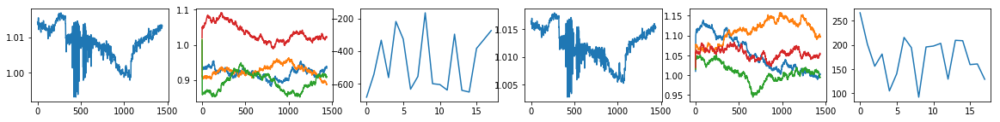

Agent: 2 | Defense | Reward: -543.293683 | Episode: 18 
Agent: 5 | Attack  | Reward: 215.105887 | Episode: 18 

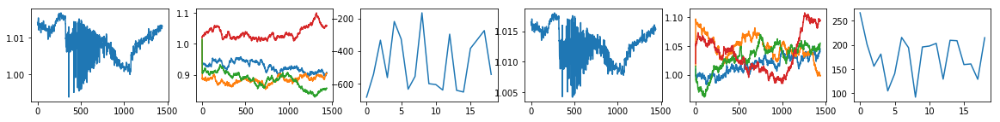

Agent: 2 | Defense | Reward: -310.674628 | Episode: 19 
Agent: 5 | Attack  | Reward: 134.183100 | Episode: 19 

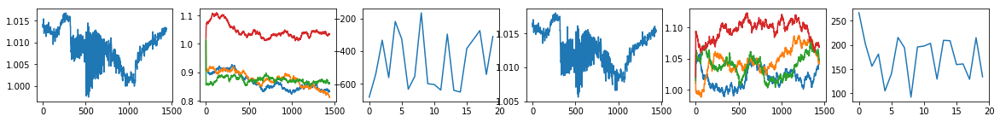

Agent: 2 | Defense | Reward: -689.660218 | Episode: 20 
Agent: 5 | Attack  | Reward: 225.151698 | Episode: 20 

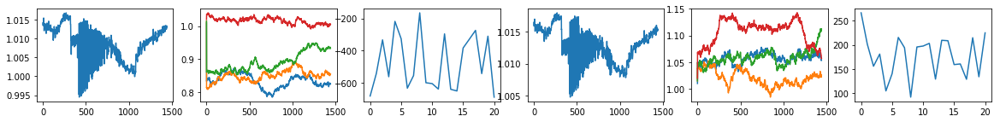

Agent: 2 | Defense | Reward: -610.105693 | Episode: 21 
Agent: 5 | Attack  | Reward: 199.641744 | Episode: 21 

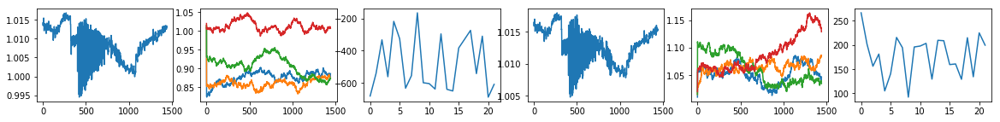

Agent: 2 | Defense | Reward: -343.641036 | Episode: 22 
Agent: 5 | Attack  | Reward: 147.718883 | Episode: 22 

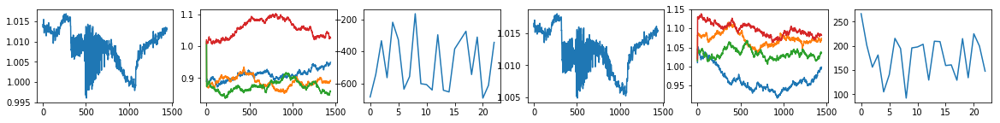

Agent: 2 | Defense | Reward: -180.633303 | Episode: 23 
Agent: 5 | Attack  | Reward: 94.321834 | Episode: 23 

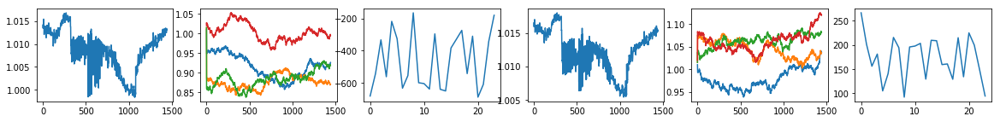

Agent: 2 | Defense | Reward: -382.859441 | Episode: 24 
Agent: 5 | Attack  | Reward: 173.575778 | Episode: 24 

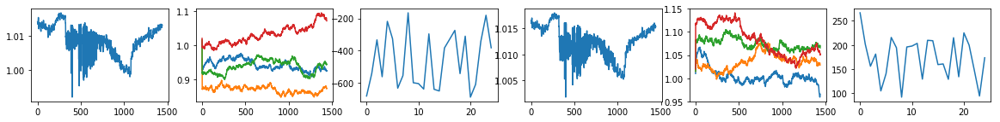

Agent: 2 | Defense | Reward: -334.984266 | Episode: 25 
Agent: 5 | Attack  | Reward: 139.320330 | Episode: 25 

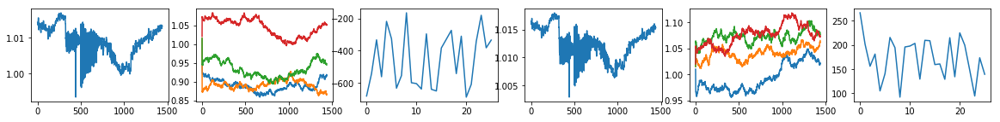

Agent: 2 | Defense | Reward: -676.002140 | Episode: 26 
Agent: 5 | Attack  | Reward: 210.613695 | Episode: 26 

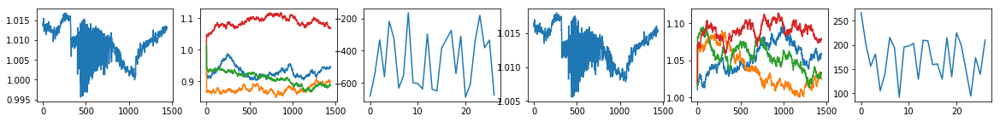

Agent: 2 | Defense | Reward: -661.930449 | Episode: 27 
Agent: 5 | Attack  | Reward: 218.740448 | Episode: 27 

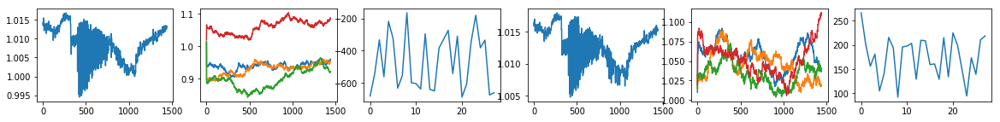

Agent: 2 | Defense | Reward: -656.080756 | Episode: 28 
Agent: 5 | Attack  | Reward: 210.185660 | Episode: 28 

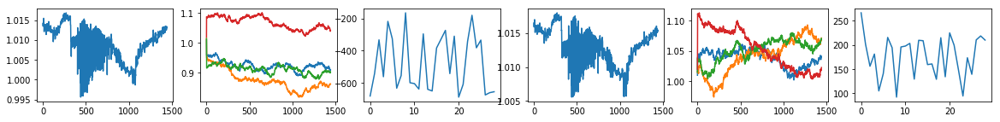

Agent: 2 | Defense | Reward: -270.592022 | Episode: 29 
Agent: 5 | Attack  | Reward: 117.080894 | Episode: 29 

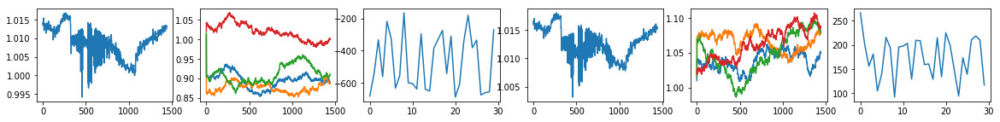

Agent: 2 | Defense | Reward: -562.748153 | Episode: 30 
Agent: 5 | Attack  | Reward: 181.218082 | Episode: 30 

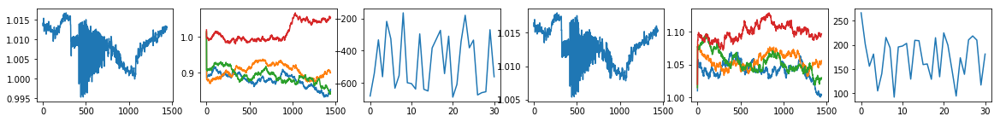

Agent: 2 | Defense | Reward: -726.576226 | Episode: 31 
Agent: 5 | Attack  | Reward: 256.543974 | Episode: 31 

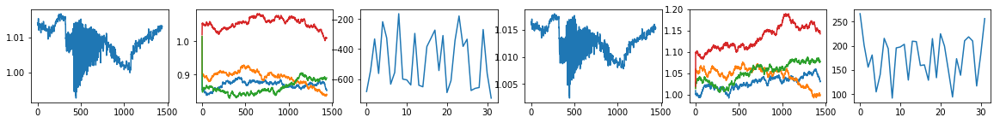

Agent: 2 | Defense | Reward: -637.495767 | Episode: 32 
Agent: 5 | Attack  | Reward: 207.620986 | Episode: 32 

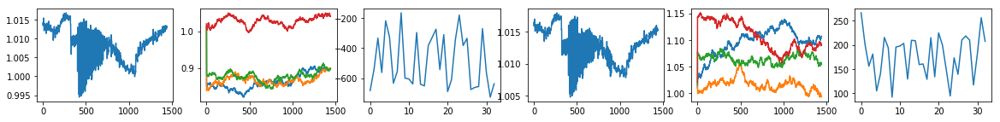

Agent: 2 | Defense | Reward: -616.053900 | Episode: 33 
Agent: 5 | Attack  | Reward: 197.976787 | Episode: 33 

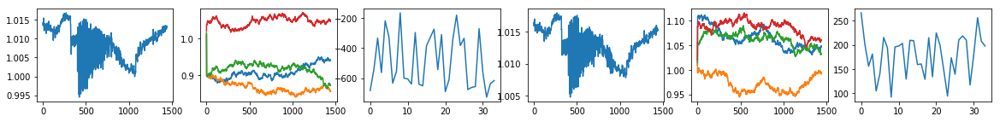

Agent: 2 | Defense | Reward: -638.585385 | Episode: 34 
Agent: 5 | Attack  | Reward: 206.157469 | Episode: 34 

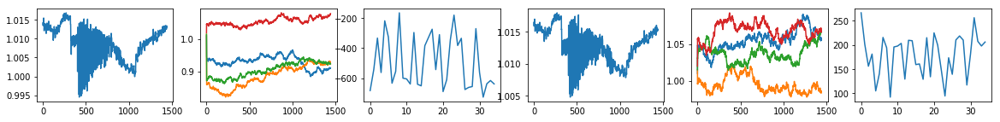

Agent: 2 | Defense | Reward: -611.055400 | Episode: 35 
Agent: 5 | Attack  | Reward: 197.616776 | Episode: 35 

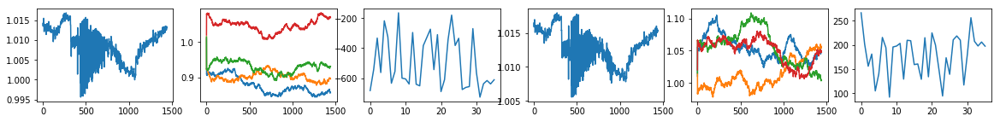

Agent: 2 | Defense | Reward: -713.661400 | Episode: 36 
Agent: 5 | Attack  | Reward: 251.858120 | Episode: 36 

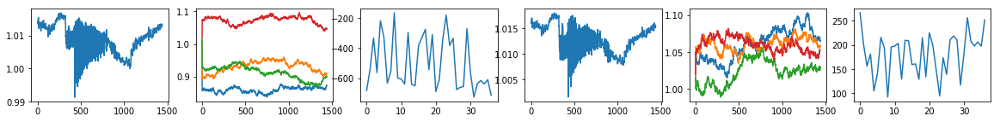

Agent: 2 | Defense | Reward: -482.034906 | Episode: 37 
Agent: 5 | Attack  | Reward: 169.051843 | Episode: 37 

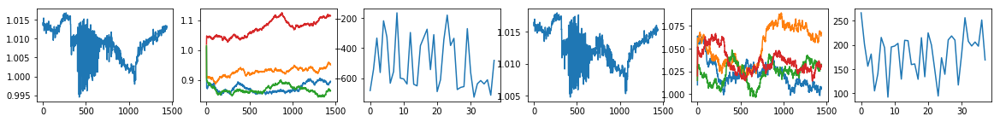

Agent: 2 | Defense | Reward: -487.060248 | Episode: 38 
Agent: 5 | Attack  | Reward: 186.568516 | Episode: 38 

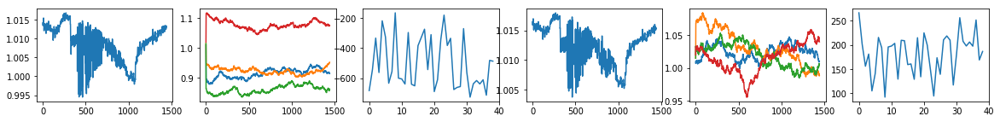

Agent: 2 | Defense | Reward: -386.335511 | Episode: 39 
Agent: 5 | Attack  | Reward: 154.834888 | Episode: 39 

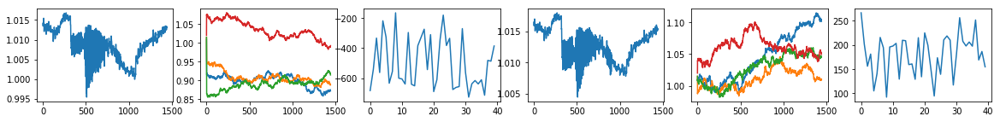

Agent: 2 | Defense | Reward: -604.661933 | Episode: 40 
Agent: 5 | Attack  | Reward: 209.586387 | Episode: 40 

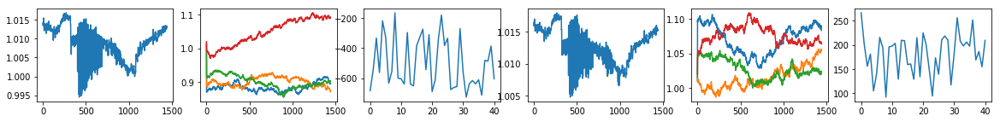

Agent: 2 | Defense | Reward: -708.621210 | Episode: 41 
Agent: 5 | Attack  | Reward: 249.709909 | Episode: 41 

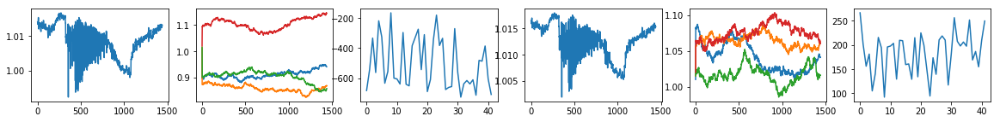

Agent: 2 | Defense | Reward: -353.377962 | Episode: 42 
Agent: 5 | Attack  | Reward: 153.744241 | Episode: 42 

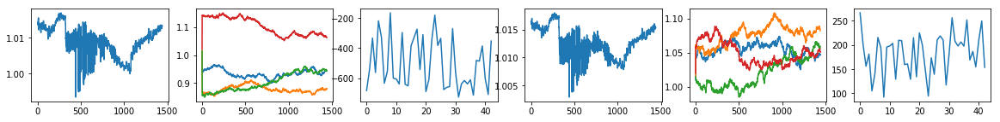

Agent: 2 | Defense | Reward: -671.500518 | Episode: 43 
Agent: 5 | Attack  | Reward: 210.285207 | Episode: 43 

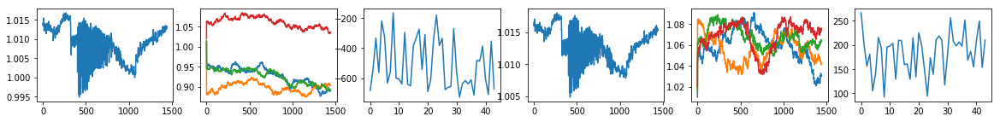

Agent: 2 | Defense | Reward: -667.245799 | Episode: 44 
Agent: 5 | Attack  | Reward: 216.520283 | Episode: 44 

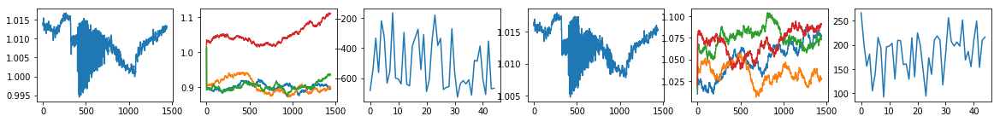

Agent: 2 | Defense | Reward: -642.264768 | Episode: 45 
Agent: 5 | Attack  | Reward: 200.605173 | Episode: 45 

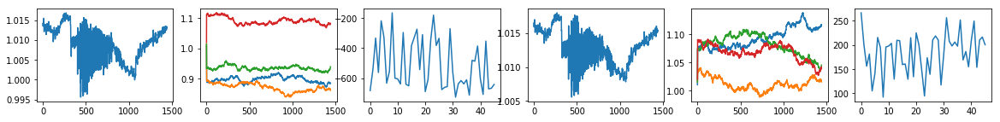

Agent: 2 | Defense | Reward: -675.462034 | Episode: 46 
Agent: 5 | Attack  | Reward: 211.789020 | Episode: 46 

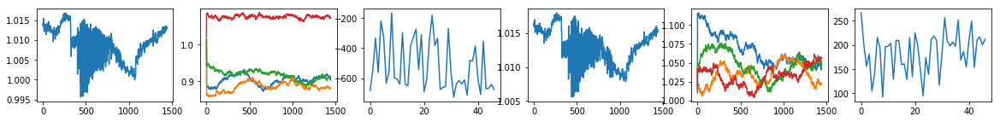

In [ ]:
import tensorflow as tf
import tflearn
import copy
main()
